# CALIBRI Bootcamp 2024
------------

# Practical Introduction to Machine Learning and Deep Learning in Medicine using Python


Instructore Da Ma (dma@wakehealth.edu)


**Objectives**
- Learning AI application in health/biomedical informatics with examples
- Compare "Machine Learning" with "Deep  Learning"
- Learn the basic building block to construct Machine/Deep Learning
- Best practice of common data processing for Machine/Deep learning 
  - Feature normalization
  - Handling class imbalance

**Thee Example Topics**

- **Topic 1: Predict clinical outcomes (`weight`) from biological measurements (`age`)**
  - Linear regression v.s. Logistic regression (Classification)
  - Multi-layer perceptron (MLP) (Deep Learning Method)
  
- **Topic 2: Spiral point classification**
  - Linear classifier (Machine learning methods)
  - Multi-layer perceptron (MLP) (Deep Learning Method)
    
- **Topic 3: Medical Image Classification**
  - Convolutional Neural Network (Deep Learning Method)

## Define  some helper functions

In [3]:
# Load libraries
import os
import pandas as pd

from tableone import TableOne, load_dataset

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression, LogisticRegressionCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, auc, roc_auc_score, balanced_accuracy_score
from sklearn.inspection import permutation_importance

import statsmodels.api as sm

#%% import libraries

%matplotlib inline
import os, pandas as pd, math
import math, time, random
import numpy as np, torch, torchvision
from torch.utils import data
from torch import nn
import torch.nn.functional as F
from torchvision import transforms

import seaborn as sns
import matplotlib.pyplot as plt
import IPython_2025
from IPython.display import display, Markdown, Latex
from copy import copy

In [170]:
# check if gpu availability
import torch
print(torch.__version__)
print(torch.backends.mps.is_available())
print(torch.device("mps"))

import torch
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print(f"GPU available: {torch.backends.mps.is_available()}")
    print(f"Device: {device}")
    a = torch.tensor([1, 2, 3], device=device)
    b = torch.tensor([4, 5, 6], device=device)
    c = a + b
    print(c)
else:
    print("MPS is not available. Please check your setup.")

2.6.0
True
mps
GPU available: True
Device: mps
tensor([5, 7, 9], device='mps:0')


In [224]:
# %% Plot dataset
def plot_dual_var_dataframes(df_list, df_names, x1='height',x2='age', y='weight', fontsize=16, markers=['o','^']):
  ''' plot for double input X
  sample dr_list: [df_train, df_valid] or [df_male, df_female]
  sample df_names: ['Train','Valid']
  '''
  fig, ax = plt.subplots(1,3, figsize=(20,5))
  # remove the bounding box of 3rd axis
  ax[2].set_visible(False)
  ax3 = fig.add_subplot(1,3,3,projection='3d')
  ax3.set_xlabel('height'), ax3.set_ylabel('age'), ax3.set_zlabel('weight')

  for i_d, df in enumerate(df_list):
    # 1st/2nd axis
    for i_x,x in enumerate([x1, x2]):
      ax[i_x].scatter(df[x], df[y])
      ax[i_x].set_xlabel(x), ax[i_x].set_ylabel(y)
      ax[i_x].legend(df_names, fontsize=fontsize)

    # 3rd axis
    ax3.scatter(df[x1], df[x2], df[y], marker=markers[i_d])

### Visualize the data
def plot_dual_var_dataframes(df_list, df_names, x1='height',x2='age', y='weight', fontsize=16, markers=['o','^']):
  ''' plot for double input X
  sample dr_list: [df_train, df_valid] or [df_male, df_female]
  sample df_names: ['Train','Valid']
  '''
  fig, ax = plt.subplots(1,3, figsize=(20,5))
  # remove the bounding box of 3rd axis
  ax[2].set_visible(False)
  ax3 = fig.add_subplot(1,3,3,projection='3d')
  ax3.set_xlabel('height'), ax3.set_ylabel('age'), ax3.set_zlabel('weight')

  for i_d, df in enumerate(df_list):
    # 1st/2nd axis
    for i_x,x in enumerate([x1, x2]):
      ax[i_x].scatter(df[x], df[y])
      ax[i_x].set_xlabel(x), ax[i_x].set_ylabel(y)
      ax[i_x].legend(df_names, fontsize=fontsize)

    # 3rd axis
    ax3.scatter(df[x1], df[x2], df[y], marker=markers[i_d])

import torch
from torch.utils.data  import Dataset, DataLoader

# Build Datasets for sample demo data
class BodyDataset(Dataset):
  def __init__(self, df, input_fields, output_field):
    '''for now input '''
    self.x = torch.tensor(df[input_fields].to_numpy()).float()
    self.y = torch.tensor(df[output_field].to_numpy()).float()
    self.x_mean, self.x_std = self.x.mean(), self.x.std()
    self.y_mean, self.y_std = self.y.mean(), self.y.std()

  def __len__(self):
    '''(compulsary method) get dataset length'''
    return len(self.y)

  def __getitem__(self, idx):
    '''(compulsary method) get an item based on th idx'''
    return (self.x[idx], self.y[idx])

def model_evaluation(model,X, y,input_fields=None, output_field=None):
  # X = ds.x
  # y = ds.y

  # Model prediction
  pred = model.predict(X)

  # Model evaluation (R squared)
  # r_sq = model.score(X, y)

  # plot/display results
  fig, ax = plt.subplots(figsize=(5,4))
  ax.scatter(X, y, marker = 'o')
  ax.scatter(X, pred, marker = '^')
  ax.legend(['ground truth','prediction'],fontsize=12)
  ax.set_xlabel(input_fields)
  ax.set_ylabel(output_field)
  # ax.set_title(f"coefficient of determination: {r_sq:.3f}")
  # return r_sq

#%% check parameter size
def print_param_size(net):
  # check parameter size
  print("=== parameter size ===")
  for p in net.parameters():
      print(list(p.shape))

#%% check network layerwise feature size
def print_layerwise_feature_size(net, X, batch_size=50):
    # from IPython.display import display, Markdown, Latex
    print("=== feature size ===")
    if isinstance(X, Dataset):
      X = DataLoader(X, batch_size=batch_size)
    if isinstance(X, DataLoader):
      X, _ = next(iter(X))
    if isinstance(X,torch.Tensor) and len(X.shape) < 1:
      X = x.reshape(1,-1)
    for layer in net:
        X = layer(X)
        print(f"{layer.__class__.__name__:<8} \t output shape: \t {list(X.shape)}")
        # display(Markdown(f"**{layer.__class__.__name__}** output shape: \t {X.shape}"))

#%% Initial netork layer weights/bias
def init_layer_weights(l):
  if type(l) == nn.Linear:
    #%% kaiming/xavier initial?
    stdv = 1. / math.sqrt(l.weight.size(1)) # stdv based on weight feature size
    l.weight.data.uniform_(-stdv, stdv)
    if l.bias is not None:
      l.bias.data.uniform_(-stdv, stdv)

# MLP with flexible number of hidden layers (with batchnorm)
def mlp(num_inputs=1, num_outputs=1, num_hidden_nodes=[10]):
  '''num_hidden_nodes: list of number of nodes'''
  mlp_block = []
  for num_layer_hidden_nodes in num_hidden_nodes:
    mlp_block += [nn.Linear(num_inputs, num_layer_hidden_nodes), nn.ReLU()]
    num_inputs = num_layer_hidden_nodes
  mlp_block += [nn.Linear(num_layer_hidden_nodes, num_outputs)]
  return nn.Sequential(*mlp_block)

#%% Visual check model prediction performance
def check_prediction(net,valid_ds, x_mean=None, x_std=None, y_mean=None, y_std=None, ax=None,
                     title='validation prediction'):

  valid_dl = DataLoader(valid_ds, batch_size=len(valid_ds), shuffle=False)
  # prediction
  net = net.to('cpu')
  X, y = next(iter(valid_dl))
  pred = net(X)

  # unnormalize
  if not None in [x_mean, x_std]:
    # print("unnormalize x")
    X = X * x_std + x_mean
  if not None in [y_mean, y_std]:
    # print("unnormalize y")
    pred = pred * y_std + y_mean
    y = y * y_std + y_mean

  if ax is None:
    fig, ax = plt.subplots(figsize=(5,4))

  ax.scatter(X, y, marker = 'o')
  ax.scatter(X, pred.detach(), marker = '^')
  ax.legend(['ground truth','prediction'],fontsize=12)
  ax.set_title(title)
  return ax

# data normalize
def normalize_ds(train_ds, x_mean=None, x_std=None, y_mean=None, y_std=None, normalize_x=True, normalize_y=True):
  train_ds_norm = copy(train_ds)

  # normalize x
  if None in [x_mean, x_std]:
    x_mean, x_std= train_ds.x.mean(), train_ds.x.std()
  if normalize_x is True:
    train_ds_norm.x = (train_ds.x - x_mean)/x_std

  # normalize y
  if None in [y_mean, y_std]:
    y_mean, y_std= train_ds.y.mean(), train_ds.y.std()
  if normalize_y is True:
    train_ds_norm.y = (train_ds.y - y_mean)/y_std


  return train_ds_norm, x_mean, x_std, y_mean, y_std

def unnormalize_ads(valid_ds, x_mean=None, x_std=None, y_mean=None, y_std=None):
  valid_ds_unform = copy(valid_ds)
  # unnormalize dataset
  if not None in [x_mean, x_std, y_mean, y_std]:
    valid_ds_unform.x = valid_ds.x * x_std + x_mean
    valid_ds_unform.y = valid_ds.y * y_std + y_mean
  return valid_ds_unform

# visualizing training procedures
def plot_sequence_images(image_array, interval=100, to="jshtml"):
    ''' Display images sequence as an animation in jupyter notebook

    Args:
        image_array(numpy.ndarray): image_array.shape equal to (num_images, height, width, num_channels)
    '''
    from matplotlib import animation
    from IPython.display import display, HTML
    dpi = 72.0
    xpixels, ypixels = image_array[0].shape[:2]
    fig = plt.figure(figsize=(ypixels/dpi, xpixels/dpi), dpi=dpi)
    im = plt.figimage(image_array[0])

    def animate(i):
        im.set_array(image_array[i])
        return (im,)

    anim = animation.FuncAnimation(fig, animate, frames=len(image_array), interval=interval, repeat_delay=10, repeat=True)
    if to == "jshtml":
      display(HTML(anim.to_jshtml()))
    elif to == "html5_video":
      display(HTML(anim.to_html5_video()))

# Main function: define the training process

def learner(net, train_ds, valid_ds, num_epochs, batch_size, lr, loss_function=nn.MSELoss(), optimizer=torch.optim.SGD, weight_decay=0.01,
            verbose=True, device='mps', init_param=False, normalize=False, init_param_func=init_layer_weights, plot_init_guess=False):

  # normalize dataset
  x_mean, x_std, y_mean, y_std = None, None, None, None
  if normalize is True:
    train_ds, x_mean, x_std, y_mean, y_std = normalize_ds(train_ds)
    valid_ds = normalize_ds(valid_ds, x_mean, x_std, y_mean, y_std)[0]

  train_dl = DataLoader(train_ds, batch_size, shuffle=True)
  valid_dl = DataLoader(valid_ds, batch_size=len(valid_ds), shuffle=False)

  # random initialize weights
  if init_param is True:
    net.apply(init_param_func);

  if plot_init_guess is True:
    ax = check_prediction(net, valid_ds)
    ax.set_title('initial guess')

  net.to(device)

  # define optimizer
  trainer = optimizer(net.parameters(), lr=lr, weight_decay=weight_decay)
  train_loss_array, valid_loss_array, valid_pred_array = [], [], []

  # for drawing training sequence
  val_images = []
  fig, ax = plt.subplots(figsize=(12,7))

  for epoch in range(num_epochs):
    # Training step
    train_loss = torch.tensor(0.)
    numel = 0
    for X, y in train_dl:
      X, y = X.to(device), y.to(device)
      y_hat = net(X)                        # prediction `y_hat`
      l = loss_function(y_hat, y)           # Minibatch loss in `X` and `y`
      trainer.zero_grad()                   # clear(zero) the gradient of all parameters
      l.sum().backward()                    # Compute gradient on `l` with respect to [`w`, `b`]
      trainer.step()                        # Update parameters using their gradient

      batch_elem = y_hat.shape[0]
      numel += batch_elem
      train_loss = l * batch_elem
    train_loss = train_loss / numel
    train_loss_array.append(train_loss)

    # Evaluation step
    with torch.no_grad():
      valid_loss = torch.tensor(0.)
      valid_pred = torch.empty(0).to(device)
      numel = 0
      for X, y in valid_dl:
        X, y = X.to(device), y.to(device)
        y_hat = net(X)
        valid_l = loss_function(y_hat, y)
        batch_elem = y_hat.shape[0]
        numel += batch_elem
        valid_loss = valid_l * batch_elem
        valid_pred = torch.cat((valid_pred, y_hat))

        # Used to return the plot as an image array
        # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
        plt.cla()
        ax.scatter(X.cpu().data.numpy(), y.cpu().data.numpy(), color = "orange")
        ax.scatter(X.cpu().data.numpy(), y_hat.cpu().data.numpy(), color='green')
        ax.set_title(f"Validation prediction (epoch={epoch}, val_loss={valid_l:.4f})", fontsize=20)
        ax.set_xlabel('X', fontsize=20)
        ax.set_ylabel('Y', fontsize=20)
        ax.legend(['Groundtruth','Prediction'], fontsize=20)
        fig.canvas.draw()       # draw the canvas, cache the renderer
        width, height = fig.canvas.get_width_height()
        # image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
        image = np.frombuffer(fig.canvas.buffer_rgba(), dtype='uint8').reshape(height, width, 4)
        # image  = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
        # Convert from RGBA to RGB if needed
        image = image[:, :, :3]
        val_images.append(image)
        del image

      valid_loss = valid_loss / numel
      valid_loss_array.append(valid_loss)
      valid_pred_array.append(valid_pred)

    if verbose is True:
      IPython.display.clear_output(wait=True)
      display(Markdown(f'**epoch**: {epoch+1:>3d}, &nbsp; **train loss**: {float(train_loss):>.4f}， &nbsp; **valid loss**: {float(valid_loss):>.4f}'))

  train_loss_array = torch.stack(train_loss_array)
  valid_loss_array = torch.stack(valid_loss_array)

  plt.close()
  return train_loss_array, valid_loss_array, val_images

def plot_loss_vs_epochs(num_epochs, train_losses, valid_losses, ax=None):
  # plot losses v.s. epochs
  if ax is None:
    fig, ax = plt.subplots(1,1,figsize=(4,4))


  ax.plot(list(range(num_epochs)), train_losses.detach().cpu())
  ax.plot(list(range(num_epochs)), valid_losses.detach().cpu())
  ax.set_title('losses v.s. epochs')
  ax.legend(['train loss','valid loss'])

# combine all training/evaluation steps

def train_valid_plot(net, train_ds, valid_ds, num_epochs=10, batch_size=50, lr=0.03,
                      loss_function=nn.MSELoss(), optimizer=torch.optim.SGD,
                      weight_decay=0.01, verbose=True, device='mps',
                      init_param=False, normalize=False, unnormalize=False,
                      init_param_func=init_layer_weights, plot_init_guess=False):

  train_losses, valid_losses, val_images = learner(net, train_ds, valid_ds, num_epochs=num_epochs, lr=lr,
                                      device=device, batch_size=batch_size, loss_function=loss_function,
                                      optimizer=optimizer, verbose=verbose, normalize=normalize,
                                      init_param=init_param, init_param_func=init_param_func,
                                      plot_init_guess=plot_init_guess, weight_decay=weight_decay)

  # plot losses v.s. epochs
  fig, ax = plt.subplots(1,2,figsize=(10,4))

  ax[0].plot(list(range(num_epochs)), train_losses.detach().cpu())
  ax[0].plot(list(range(num_epochs)), valid_losses.detach().cpu())
  ax[0].set_title('losses v.s. epochs')
  ax[0].legend(['train loss','valid loss'])

  # plot ground truth v.s. prediction
  check_prediction(net, valid_ds, ax=ax[1])

  ax[1].set_title('validation prediction')
  return train_losses, valid_losses, val_images


# Topic 1: : **Predicting outcome `weight` from single input feature `age`**

**Outline**:

- Conventional Statistical/Machine-learning approach
  - Linear Regression (Regression)
  - Logistic Regression (Classification)


- Deep Learning approach
  - Multi-layer perceptron (MLP)


- Data Preprocessing
  - Categorical variables: One-Hot-Encoding
  - Continuous variables: feature normalizing

- Model Evaluation and Comparison
  - Evaluation Metrics
  - Train/Valid/Test data split
  - Cross-validation


- Hands on Python-based Machine-Learning Frameworks (e.g. python libraries)
  - `Scikit-Learn` / `statsmodel`
  - `PyTorch` (Transition towards Deep Learning)

- Class Imbalance - Weighted Sampling
- Cross Validation
- Feature Importance Analysis


**Reference**:

- Linear Regression in Python: https://realpython.com/linear-regression-in-python/
- Logistic Regression in Python: https://realpython.com/logistic-regression-python/
- Feature importance: https://forecastegy.com/posts/feature-importance-in-logistic-regression/

# Regression v.s. Classification

- **Linear Regression**:   supervised **regression** problem
  > - Estimate the dependent variable in case of a change in independent variable
  > - Building block of more advanced statistical and machine learning methods, such as logistic regression, as well as deep neural network (deep learning)
  
- **Logistic Regression**: supervised **classification** problem
  > - Calculate the probability of an event

![Linear v.s. Logistic Regression](https://editor.analyticsvidhya.com/uploads/71562linear_vs_logistic_regression_edxw03.png)

> **Reference**:
> - https://www.geeksforgeeks.org/ml-linear-regression-vs-logistic-regression/
> - https://www.analyticsvidhya.com/blog/2020/12/beginners-take-how-logistic-regression-is-related-to-linear-regression/

## Load data


In [6]:
# Read the uploaded file
data_path = "heightweight.csv"
df_demo = pd.read_csv(data_path)

# Explore the data

In [7]:
# lookt at the data
print(len(df_demo))
df_demo

544


,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0
...,...,...,...,...
539,145.415,31.127751,17.0,1
540,162.560,52.163080,31.0,1
541,156.210,54.062497,21.0,0
542,71.120,8.051258,0.0,1


## Visualize the data

- Task: Predict **Body Weight** (clinically meaningful outcome) with **Age** (measurable input)

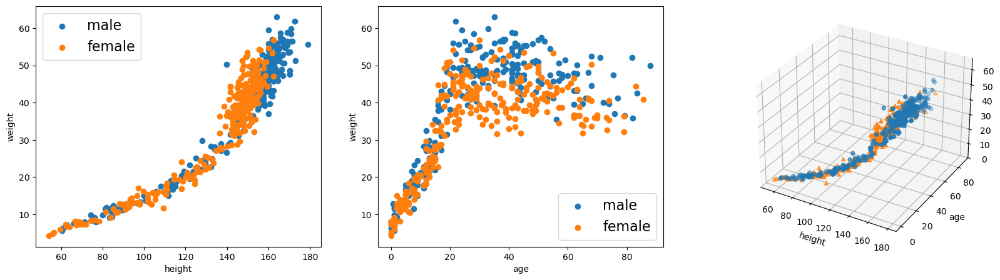

In [24]:
# visualize the data
df_male, df_female = df_demo[df_demo['male']==1], df_demo[df_demo['male']==0]
plot_dual_var_dataframes([df_male, df_female], df_names=["male", "female"])

## Split the data into Training/Validation/Test set
- Hold-out 10% of the data as the **"independent"** or **"out-of-distribution"** test dataset for evaluate the generalizability of the model performance

- Sometimes, a **"validation dataset"** need to be further reserved, for:
  - 1) hyperparameter tuning; or
  - 2) k-fold cross-validation

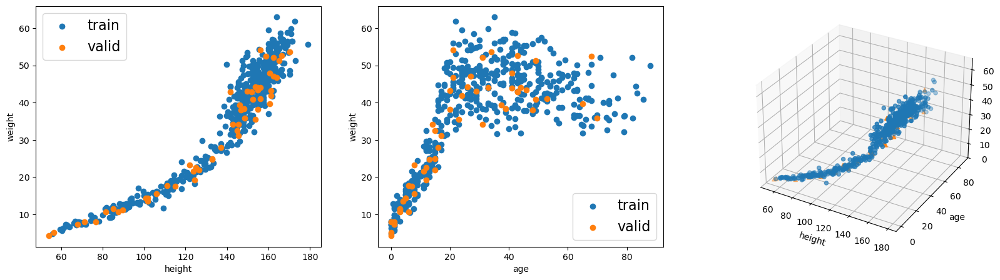

In [25]:
# Visualize data distribution
train_no = int(len(df_demo)*0.9)
# split training/validation dataset
df_train, df_valid = df_demo[:train_no], df_demo[train_no:]
len(df_train), len(df_valid)
plot_dual_var_dataframes([df_train, df_valid], df_names=["train", "valid"])

In [26]:
# Build the "Dataset" library
input_fields, output_field = ['age'], ['weight']
train_ds = BodyDataset(df_train, input_fields, output_field)
valid_ds = BodyDataset(df_valid, input_fields, output_field)
display(Markdown(f"**Train**: {len(train_ds)}, **Valid**: {len(valid_ds)}"))

**Train**: 489, **Valid**: 55

In [93]:
# Check model input v.s. output
pd.DataFrame({'X': train_ds.x.numpy().flatten(), 'y': train_ds.y.numpy().flatten()})

,X,y
0,63.0,47.825607
1,63.0,36.485806
2,65.0,31.864838
3,41.0,53.041916
4,51.0,41.276871
...,...,...
484,43.0,45.217453
485,38.0,51.255898
486,10.0,21.205425
487,3.0,11.594946


# Linear Regression
**(Single variable prediction)**

- Simplest Machine Learning Model

> $\hat{Y} = \beta_0 + \beta_1 X + \epsilon$

> - Weight and Bias

![Linear Regression](https://files.realpython.com/media/fig-lin-reg.a506035b654a.png)
> Ref: Linear Regression in Python – Real Python: https://realpython.com/linear-regression-in-python/

## Linear regression using `scikit-learn`

In [27]:
model = LinearRegression()

In [28]:
model.fit(train_ds.x, train_ds.y);

## Evaluate model

**Plot results**

In [29]:
def model_evaluation(model,X, y,input_fields=None, output_field=None):
  # X = ds.x
  # y = ds.y

  # Model prediction
  pred = model.predict(X)

  # Model evaluation (R squared)
  # r_sq = model.score(X, y)

  # plot/display results
  fig, ax = plt.subplots(figsize=(5,4))
  ax.scatter(X, y, marker = 'o')
  ax.scatter(X, pred, marker = '^')
  ax.legend(['ground truth','prediction'],fontsize=12)
  ax.set_xlabel(input_fields)
  ax.set_ylabel(output_field)
  # ax.set_title(f"coefficient of determination: {r_sq:.3f}")
  # return r_sq

# Evaluate on the training data

coefficient of determination: 0.441


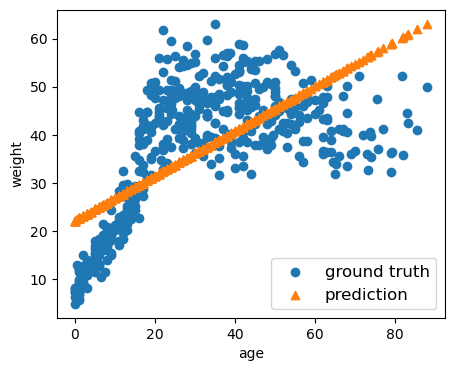

In [30]:
model_evaluation(model,train_ds.x, train_ds.y,
                        input_fields[0],output_field[0])
r_sq = model.score(train_ds.x, train_ds.y)
print(f"coefficient of determination: {r_sq:.3f}")

coefficient of determination: 0.564


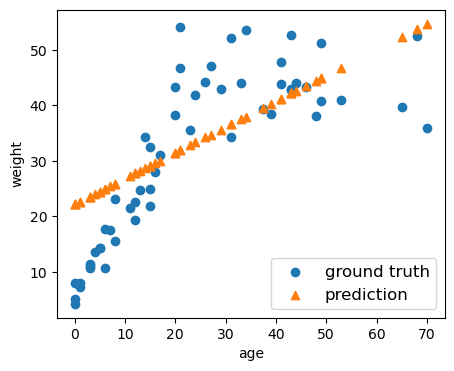

In [31]:
model_evaluation(model,valid_ds.x, valid_ds.y,
                 input_fields[0],output_field[0])
r_sq = model.score(valid_ds.x, valid_ds.y)
print(f"coefficient of determination: {r_sq:.3f}")

## Topic 1.2 Linear regression using `statsmodel`


Let's look again at the linear regression formula:

$\hat{Y} = \beta_0 + \beta_1 X + \epsilon$

Where:

- $\hat{Y}$ represents the predicted or estimated dependent variable.
- $\beta_0$ is the intercept.
- $\beta_1$ is the coefficient for the independent variable \(X\).
- $X$ is the independent variable.
- $\epsilon$ represents the error term.


In [32]:
import numpy as np
import statsmodels.api as sm

- `statsmodels` doesn’t take 𝑏₀ into account by default
- You need to add the column of ones to the inputs if you want `statsmodels` to calculate the intercept 𝑏₀.


In [33]:
# Add constant
X = sm.add_constant(train_ds.x)
X[:10,:]

array([[ 1., 63.],
       [ 1., 63.],
       [ 1., 65.],
       [ 1., 41.],
       [ 1., 51.],
       [ 1., 35.],
       [ 1., 32.],
       [ 1., 27.],
       [ 1., 19.],
       [ 1., 54.]])

In [34]:
y = np.array(train_ds.y)

/var/folders/cb/sv5xpw4s4vgf4jx60klk07t80000gp/T/ipykernel_9163/3617591937.py:1: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  y = np.array(train_ds.y)


# Build/fit linear regression model
> `Ordinary Least Square` (OLS)

In [35]:
model = sm.OLS(y, X)
results = model.fit()

- Explore the results

In [36]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.441
Model:                            OLS   Adj. R-squared:                  0.440
Method:                 Least Squares   F-statistic:                     384.9
Date:                Fri, 30 May 2025   Prob (F-statistic):           1.39e-63
Time:                        08:13:18   Log-Likelihood:                -1862.5
No. Observations:                 489   AIC:                             3729.
Df Residuals:                     487   BIC:                             3737.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.1508      0.865     25.595      0.0


> You can find many statistical values associated with linear regression, including 𝑅², 𝑏₀, 𝑏₁, and 𝑏₂, etc.

- **`rsquared`**: 𝑅².
- **`rsquared_ad`**: adjusted 𝑅 ( 𝑅² corrected according to the number of input feature)
- **`para`**: array with 𝑏₀, 𝑏₁, and 𝑏₀₂.

In [37]:
print(f"- Coefficient of determination: {results.rsquared:.3f}")
print(f"- Adjusted coefficient of determination: {results.rsquared_adj:.3f}")
print(f"- Regression coefficients: {results.params}")

- Coefficient of determination: 0.441
- Adjusted coefficient of determination: 0.440
- Regression coefficients: [22.15084351  0.4653134 ]


## Predict on unseen (validation) data

In [38]:
X = sm.add_constant(valid_ds.x)
y = np.array(valid_ds.y)

/var/folders/cb/sv5xpw4s4vgf4jx60klk07t80000gp/T/ipykernel_9163/1576275188.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  y = np.array(valid_ds.y)


In [39]:
y_predict = results.predict(X)

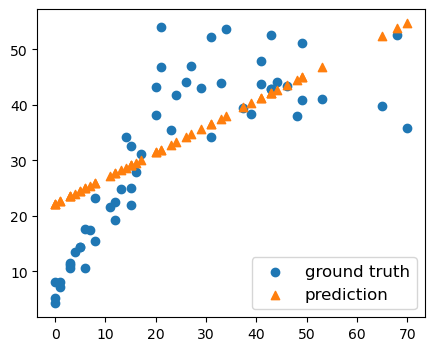

In [40]:
fig, ax = plt.subplots(figsize=(5,4))
ax.scatter(valid_ds.x, y, marker = 'o')
ax.scatter(valid_ds.x, y_predict, marker = '^')
ax.legend(['ground truth','prediction'],fontsize=12)

> The validation results are the same as using the `scikit-learn` library

## Topic 1.3 Classification - through "Logistic Regression"

- [Recap] **Logistic Regression**: supervised **classification** problem
  > - Calculate the probability of an event (binary classification)

![Linear v.s. Logistic Regression](https://editor.analyticsvidhya.com/uploads/71562linear_vs_logistic_regression_edxw03.png)

- Use a cutoff point to "dichotomize" continuous variable into categories
- Effectively converting the `regression` problem into `classification` problem
- This is a common practice in clinical settings
  - such as identify diebetic/prediabetic patients with abnormally high `A1C` value
  - Determing cognitive decline and neurodegeneration

In [124]:
# Feature transformation (Z-score standardization), only on training data
scaler = StandardScaler()
x_train = scaler.fit_transform(train_ds.x)
# Weight cutoff point = 30
y_train_logit = np.asarray(train_ds.y > 30).flatten()

In [125]:
# Check feature/output transformation
display(Markdown(f"Check feature/output transformation **on train data**"))
pd.DataFrame({'X (pre)': train_ds.x.numpy().flatten(), 'X (post)': x_train.flatten(), 'y (pre)': train_ds.y.numpy().flatten(), "y (post)": y_train_logit.flatten()})


Check feature/output transformation **on train data**

,X (pre),X (post),y (pre),y (post)
0,63.0,1.585439,47.825607,True
1,63.0,1.585439,36.485806,True
2,65.0,1.681371,31.864838,True
3,41.0,0.530183,53.041916,True
4,51.0,1.009845,41.276871,True
...,...,...,...,...
484,43.0,0.626116,45.217453,True
485,38.0,0.386285,51.255898,True
486,10.0,-0.956768,21.205425,False
487,3.0,-1.292532,11.594946,False


## Generate/Train a model

In [111]:
model = LogisticRegression(solver='liblinear', C=0.05, multi_class='ovr',
                           random_state=0)
model.fit(x_train, y_train_logit)

/Users/dma/miniconda3/envs/python3.12/lib/python3.12/site-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/dma/miniconda3/envs/python3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegression(C=0.05, multi_class='ovr', random_state=0,
                   solver='liblinear')

# Evaluate classification model performance
**Confusion Matrix**

- **Accuracy** = `(TP + TN) / (TP+FN+FP+TN)`
  > number of correct positive predictions made out of all positive predictions.

![Confusion Matrix](https://miro.medium.com/v2/resize:fit:592/format:webp/1*caZznwCkPjh3kc2oHx-HwQ.png)
![](https://miro.medium.com/v2/resize:fit:640/format:webp/1*_Pfvl289nSTUPj4m64toXw.png)

## Evaluation Models

**Q**: How to evaluate classification model performance?

**Evaluation Metrics**

- **Accuracy** = `(TP + TN) / (TP+FN+FP+TN)`
  > number of correct positive predictions made out of all positive predictions.
- **Recall/Sensitivity** = `TP / (TP+FN)`
  > number of correct positive predictions made out of all positive predictions.
- **Precision** = `TP/(TP + FP)`
  > number of correct positive predictions made out of positive predictions
- **F1 Score** = `2 * (( precision * recall ) / ( precision + recall ))`
- **Balanced Accuracy** = `( sensitivity * specificity ) / 2)`
  > useful in dealing with imbalanced data
  - **Sensitivity** = `TP / (TP + FN)`
  - **Specificity** = `TN / (TN + FP)`
- **ROC_AUC**
  > Area Under the Curve - Receiver Operator Characteristic. It summarizes the trade-off between the true positive rates and the false-positive rates for a predictive model. ROC yields good results when the observations are balanced between each class.

![ROC_AUC](https://upload.wikimedia.org/wikipedia/commons/thumb/1/13/Roc_curve.svg/800px-Roc_curve.svg.png)

> Ref: https://towardsdatascience.com/a-look-at-precision-recall-and-f1-score-36b5fd0dd3ec
> Ref: https://neptune.ai/blog/balanced-accuracy


## Graph of classification evaluation metrics
![evaluation metrics](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*oERQU89L7peizVpu_qZEjA.png)


> Model Training

In [127]:
# Model Training
model = LogisticRegression(solver='liblinear', C=0.05, multi_class='ovr',
                           random_state=0)
model.fit(x_train, y_train_logit);

/Users/dma/miniconda3/envs/python3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


> Model evaluation

In [130]:
x_test = scaler.transform(valid_ds.x)
y_test_logit = np.asarray(valid_ds.y > 30)

In [131]:
y_pred_logit = model.predict(x_test)

## Training data performance

In [133]:
# model.score(x_train, y_train_logit)
accuracy_score(y_train_logit, model.predict(x_train))

0.967280163599182

## Test data performance

In [134]:
# model.score(x_test, y_pred_logit)
accuracy_score(y_test_logit, y_pred_logit)

0.9454545454545454

## Confusion Matrix
- Evaluated on the Test Set

In [137]:
cm = confusion_matrix(y_test_logit, y_pred_logit)
cm

array([[23,  0],
       [ 3, 29]])

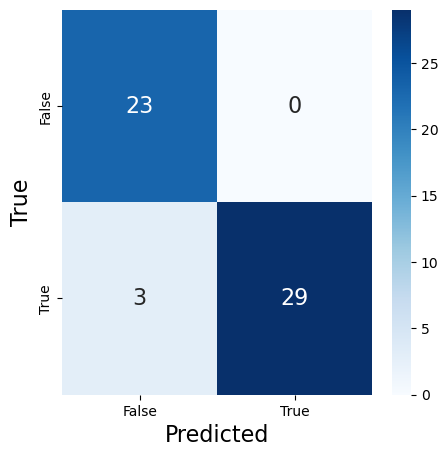

In [138]:
fig, ax = plt.subplots(1,1, figsize=(5,5))
labels = ['False','True']
titles = ['Age-Only','Multi','All']
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 16}, ax=ax,
          xticklabels=labels, yticklabels=labels)
ax.set_xlabel('Predicted',size=16);
ax.set_ylabel('True',size=16);

## Exercise (predict sex from weight)

**Train data**: 489, **Valid data**: 55

Train accuracy: 0.6053169734151329
Test accuracy: 0.5818181818181818


/Users/dma/miniconda3/envs/python3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


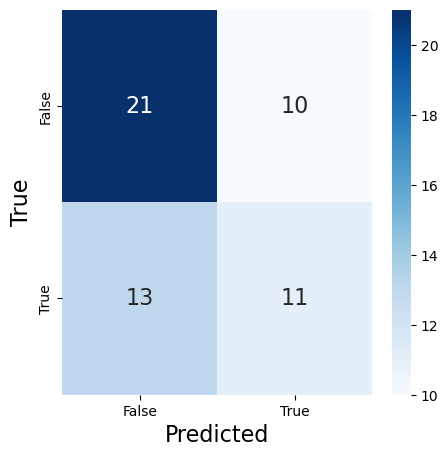

In [189]:
# Male/Female prediction

# Build Dataset
input_fields, output_field = ['weight'], ['male']
train_ds_gender = BodyDataset(df_train, input_fields, output_field)
valid_ds_gender = BodyDataset(df_valid, input_fields, output_field)
display(Markdown(f"**Train data**: {len(train_ds)}, **Valid data**: {len(valid_ds)}"))

scaler = StandardScaler()
x_train = scaler.fit_transform(train_ds_gender.x)
# Weight cutoff point = 30
y_train_gender = np.asarray(train_ds_gender.y).flatten()

model = LogisticRegression(solver='liblinear', C=0.05, multi_class='ovr', random_state=0)
model.fit(x_train, y_train_gender)

x_test = scaler.transform(valid_ds_gender.x)
y_test_gender = np.asarray(valid_ds_gender.y)
y_pred_gender = model.predict(x_test)

print('Train accuracy:', model.score(x_train, y_train_gender))
print('Test accuracy:', model.score(y_test_gender, y_pred_gender))
cm_sex = confusion_matrix(y_test_gender, y_pred_gender)

fig, ax = plt.subplots(1,1, figsize=(5,5))
labels = ['False','True']
titles = ['Age-Only','Multi','All']
sns.heatmap(cm_sex, annot=True, fmt="d", cmap="Blues", annot_kws={"size": 16}, ax=ax,
          xticklabels=labels, yticklabels=labels)
ax.set_xlabel('Predicted',size=16);
ax.set_ylabel('True',size=16);

## More rigorous validation methods: cross validation
  
- Hold-out "independent test set" more rigorous evaluation of the model performance

> - It is applicable to both regression and classification tasks.
> - It use the class labels to splitting the data into K folds (e.g. k= 5, 10, etc.), each folds will contrain different training, validation, and testing sets
> - It ensures that each fold has a similar distribution of class labels as the whole dataset.

![Cross Validation](https://scikit-learn.org/stable/_images/grid_search_cross_validation.png)


- In practice, you can use [`sklearn.model_selection.KFold`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html) to assign folds to the sample data
- More regorously, you can use [`sklearn.model_selection.StratifiedKFold`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html) to perform "stratified k-fold cross validation",
  - in which each fold contains subsamples with the same radio among different classes in the y outcome label
- Here we only implement one-fold

# Topic 1.4 PyTorch implementation
> - For both regression / logistic regression

> - Set the stage to moving towards deep learning

## Linear Regression Network


## Deep Neural Network
> (for both Linear or non-linear)

**The journey of Deep Learning**:
- 4 Core components of deep learning:
  - **1. Model （engine)**: *design of neural network architecture*
    - with learnable parameters
      - Linear component (affine transformation parameters)
      - Non-linear component
  - **2. Loss/Cost function (destination)**: *to guide the model's training*
    - function to derive the numeric number to minimize/maximize by tuning the model parameters
  - **3. Data (fuel)**: *to feed the model*
    - Mini-batch data loader
    - Preprocessing: normalize data (mean = 0, std = 1)
  - **4. Optimization (driver)**: *to stear the "training" heel*
    - mini-batch stocastic gradient descent, with tunable learning rate (step size)
    - Backpropagation: calculate the gradient backwards through the neural network to update the parameters
    
**Evaluation**
  - Hold-out validation (train/validation set split)

### 1. Build dataloader

In [190]:
# Build Dataloader
batch_size = 500 # 1,5,50,500
train_dl = DataLoader(train_ds, batch_size, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=55, shuffle=True)

# check one batch size
X, y = next(iter(train_dl))
print("input feature size (sample_size * feature_no): \t", X.shape)
print("output size        (sample_size * class_no): \t", y.shape)

input feature size (sample_size * feature_no): 	 torch.Size([489, 1])
output size        (sample_size * class_no): 	 torch.Size([489, 1])


### 2. Build model

In [191]:
net = nn.Sequential(nn.Linear(1, 1))
net

Sequential(
  (0): Linear(in_features=1, out_features=1, bias=True)
)

**Check linear model parameter**

$$
Y = wX+b
$$


> Initial value for:
> - $w$: Weight
> - $b$: Bias

- Assign random initial weight (will be different each time)

In [192]:
# Assign random initial weight (will be different each time)
parameter_names = ['Weight','Bias']
for i, parameter in enumerate(net.parameters()):
  display(Markdown(f"**{parameter_names[i]}**: {parameter.item()}"))

**Weight**: -0.5193774700164795

**Bias**: -0.6231464147567749

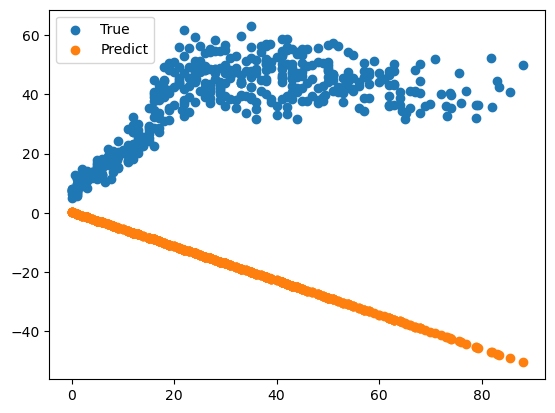

In [193]:
# Initial Prediction
net = nn.Sequential(nn.Linear(1, 1))
plt.scatter(X, y)
plt.scatter(X, net(X).detach())
plt.legend(['True','Predict'])

### 3. Define loss function
- **Mean absolute Loss**: `L1Loss`
  > $\mathrm{MAE} = \frac{\sum_{i=1}^n\left| y_i - x_i\right|}{n} =\frac{\sum_{i=1}^n\left| e_i \right|}{n}.$
- **Mean Square Loss**: `MSELoss`:

  > $\operatorname{MSE}=\frac{1}{n} \sum_{i=1}^n \left(Y_i-\hat{Y_i}\right)^2$

  ![linear_schematic](https://d2l.ai/_images/fit-linreg.svg)



In [194]:
# Mean Square Loss
loss_function=nn.MSELoss()

# Mean Absolute Loss
loss_function=nn.L1Loss()


In [195]:
# loss_function
X.shape,y.shape
loss_function(X, y)

tensor(14.1287)

### 4. Optimization


#### 4.1 Learning Rates

Choose the right learning rate is crucial for optimization to minimize the loss function

![Learning Rates](https://files.codingninjas.in/article_images/adadelta-4-1641803112.webp)

In [196]:
lr=5e-2
lr

0.05

### Optimization

**4.2 Gradient Descent**
<p align="center">
    <img src="https://miro.medium.com/max/908/1*FXHp55rpDM0tkaD5oz3Dvg.png" alt="Minibatch stochastic gradient descent" style="zoom:70%;">
</p>

- Batch Gradient Decent:
  - Take the average of the gradients of all the training examples.
  - Use the mean gradient to update parameters.
  - There is only one step of gradient descent in each epoch.

- Minibatch stochastic gradient descent
  - Pick a mini-batch from the entire dataset
  - Feed the mini-batch to Neural Network
  - Calculate the mean gradient of the mini-batch
  - Use the mean gradient to update the weights
  
  
**Loss Landscape**

![Loss Landscape](https://miro.medium.com/v2/resize:fit:828/format:webp/1*_Qd_txKxRlsMdfuH2J-k4g.png)

- calculate the local gradient to update the parameter in each step (Backpropagation）



### Build Dataloader

In [208]:
# Build Dataloader
batch_size = 10 # 1,5,50,500
train_dl = DataLoader(train_ds, batch_size, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=55, shuffle=True)

# check one batch size
X, y = next(iter(train_dl))
print("input feature size (batch X feature_no): ", X.shape)
print("output size        (batch X feature_no): ", y.shape)

input feature size (batch X feature_no):  torch.Size([10, 1])
output size        (batch X feature_no):  torch.Size([10, 1])


**epoch**:  30, &nbsp; **train loss**: 1.2604， &nbsp; **valid loss**: 9.7284

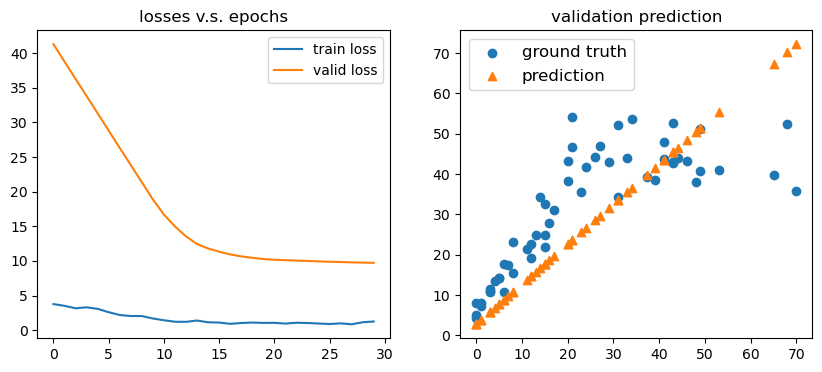

In [239]:
batch_size=10
net = nn.Sequential(nn.Linear(1, 1))
train_losses, valid_losses, val_images = train_valid_plot(net, train_ds, valid_ds, num_epochs=30, batch_size=50, lr=1e-2,
                            loss_function=loss_function, optimizer=torch.optim.AdamW, device='mps' if torch.backends.mps.is_available() else 'cpu')

In [240]:
plot_sequence_images(val_images, interval=100)

<Figure size 1200x700 with 0 Axes>

In [241]:
# Calculate the loss landscape
W, B = np.linspace(0.,2.,100), np.linspace(-1.,1.,100)
W,B = np.meshgrid(W,B)
loss = nn.MSELoss()
L = torch.empty((100,100))
labels = valid_ds.y
for id_1 in range(W.shape[0]):
  for id_2 in range(W.shape[1]):
    w_ = torch.tensor(W[id_1][id_2], requires_grad=True).float().reshape(1,1)
    b_ = torch.tensor(B[id_1][id_2], requires_grad=True).float().reshape(1)
    y_hat = torch.matmul(valid_ds.x, w_) + b_
    l = loss(y_hat, labels).sum()
    L[id_1][id_2] = l
L = L.detach().cpu().numpy()

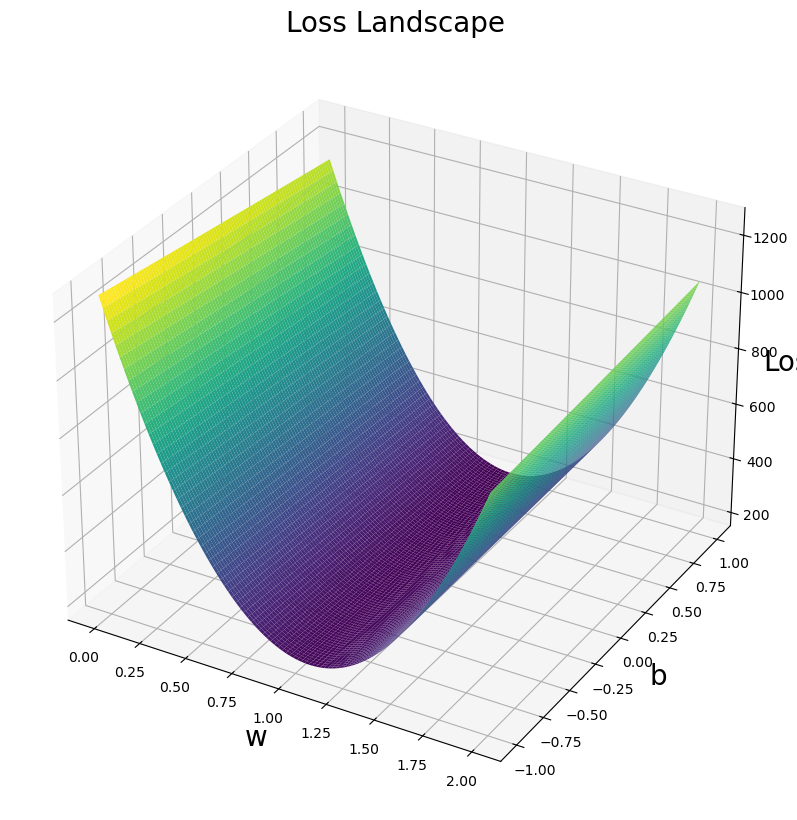

In [242]:
#%% plot the loss landscape
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.plot_surface(W, B, L, rstride=1, cstride=1, cmap='viridis', edgecolor='none')
ax.set_xlabel("w", fontsize=20);ax.set_ylabel("b", fontsize=20);
ax.set_zlabel("Loss", fontsize=20);
ax.set_title("Loss Landscape", fontsize=20);

### With data normalization

Text(0.5, 1.0, 'After Normalization')

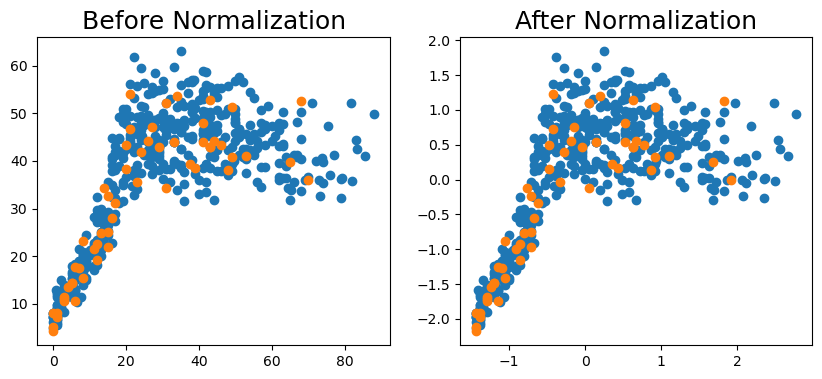

In [243]:
x_mean, x_std= train_ds.x.mean(), train_ds.x.std()
y_mean, y_std= train_ds.y.mean(), train_ds.y.std()
train_ds_norm, valid_ds_norm = copy(train_ds), copy(valid_ds)
train_ds_norm.x = (train_ds.x - x_mean)/x_std
train_ds_norm.y = (train_ds.y - y_mean)/y_std
valid_ds_norm.x = (valid_ds.x - x_mean)/x_std
valid_ds_norm.y = (valid_ds.y - y_mean)/y_std

fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].scatter(train_ds.x, train_ds.y)
ax[0].scatter(valid_ds.x, valid_ds.y)
ax[0].set_title("Before Normalization", fontsize=18)
ax[1].scatter(train_ds_norm.x, train_ds_norm.y)
ax[1].scatter(valid_ds_norm.x, valid_ds_norm.y)
ax[1].set_title("After Normalization", fontsize=18)

In [244]:
train_ds_norm, x_mean, x_std, y_mean, y_std = normalize_ds(train_ds)
valid_ds_norm = normalize_ds(valid_ds, x_mean, x_std, y_mean, y_std)[0]

**epoch**:  20, &nbsp; **train loss**: 0.0434， &nbsp; **valid loss**: 0.4599

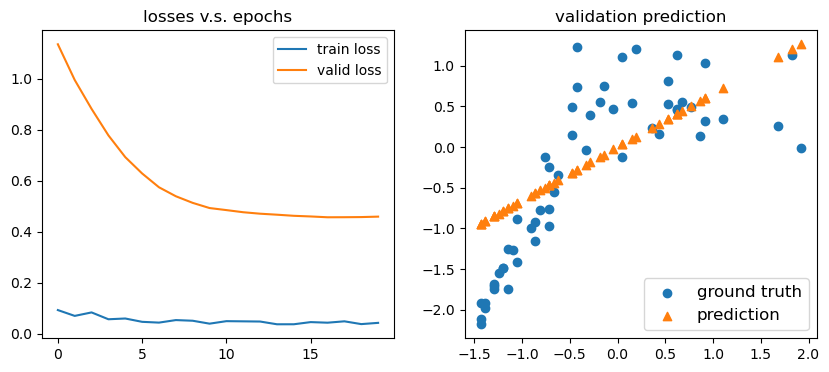

In [245]:
net = nn.Sequential(nn.Linear(1, 1))
lr=1e-2
train_losses, valid_losses, val_images = train_valid_plot(net, train_ds_norm, valid_ds_norm, num_epochs=20, batch_size=50,
                              lr=lr, loss_function=nn.MSELoss(),optimizer=torch.optim.AdamW)

**"Easier to converge?**
> (only need 20 epochs)

In [246]:
plot_sequence_images(val_images, interval=200)

<Figure size 1200x700 with 0 Axes>

### loss landscape
> Look at the loss landscape around the global minimal area

In [247]:
# Calculate the loss landscape
W, B = np.linspace(0.,2.,100), np.linspace(-1.,1.,100)
W,B = np.meshgrid(W,B)
loss = nn.MSELoss()
L = torch.empty((100,100))
labels = valid_ds_norm.y
for id_1 in range(W.shape[0]):
  for id_2 in range(W.shape[1]):
    w_ = torch.tensor(W[id_1][id_2], requires_grad=True).float().reshape(1,1)
    b_ = torch.tensor(B[id_1][id_2], requires_grad=True).float().reshape(1)
    y_hat = torch.matmul(valid_ds_norm.x, w_) + b_
    l = loss(y_hat, labels).sum()
    L[id_1][id_2] = l
L = L.detach().cpu().numpy()

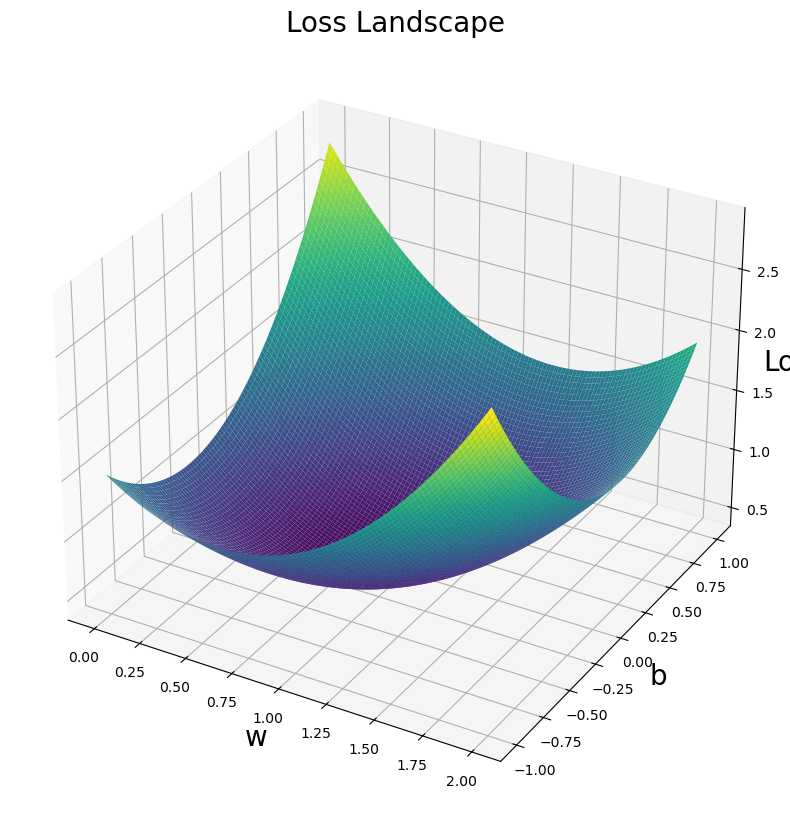

In [248]:
#%% plot the loss landscape
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.plot_surface(W, B, L, rstride=1, cstride=1, cmap='viridis', edgecolor='none')
ax.set_xlabel("w", fontsize=20);ax.set_ylabel("b", fontsize=20);
ax.set_zlabel("Loss", fontsize=20);
ax.set_title("Loss Landscape", fontsize=20);

## Topic 1.5 Moving towards non-linearity - Deep Learning

### Build Multi-Layer Perceptron (MLP) model
> An MLP with a hidden layer of 5 hidden units.

> Using single input variable: ("weight")

![An MLP with a hidden layer of 5 hidden units.](http://d2l.ai/_images/mlp.svg)

- Activation function: from linear to non-linear

> Linear (Affine):
$$
\begin{aligned}
    \mathbf{H} & = \mathbf{X} \mathbf{W}^{(1)} + \mathbf{b}^{(1)}, \\
    \mathbf{O} & = \mathbf{H}\mathbf{W}^{(2)} + \mathbf{b}^{(2)}.
\end{aligned}
$$

> Non-linear operation (sigma) applied over the hidden layer
$$
\begin{aligned}
    \mathbf{H} & = \sigma(\mathbf{X} \mathbf{W}^{(1)} + \mathbf{b}^{(1)}), \\
    \mathbf{O} & = \mathbf{H}\mathbf{W}^{(2)} + \mathbf{b}^{(2)}.\\
\end{aligned}
$$

- **Activation function**: ReLU （Rectified Linear Unit）

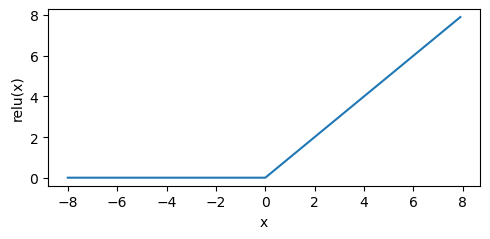

In [249]:
x = torch.arange(-8.0, 8.0, 0.1, requires_grad=True)
y = torch.relu(x)
fig, ax = plt.subplots(figsize=(5, 2.5))
plt.plot(x.detach(), y.detach())
ax.set_xlabel("x")
ax.set_ylabel("relu(x)")
plt.tight_layout()

In [250]:
# MLP with flexible number of hidden layers (with batchnorm)
def mlp(num_inputs=1, num_outputs=1, num_hidden_nodes=[10]):
  '''num_hidden_nodes: list of number of nodes'''
  mlp_block = []
  for num_layer_hidden_nodes in num_hidden_nodes:
    mlp_block += [nn.Linear(num_inputs, num_layer_hidden_nodes), nn.ReLU()]
    num_inputs = num_layer_hidden_nodes
  mlp_block += [nn.Linear(num_layer_hidden_nodes, num_outputs)]
  return nn.Sequential(*mlp_block)

In [251]:
# check network architecture
mlpb_1 = mlp(num_inputs=1, num_outputs=1, num_hidden_nodes=[10])
mlpb_1

Sequential(
  (0): Linear(in_features=1, out_features=10, bias=True)
  (1): ReLU()
  (2): Linear(in_features=10, out_features=1, bias=True)
)

In [252]:
print_param_size(mlpb_1)

=== parameter size ===
[10, 1]
[10]
[1, 10]
[1]


In [253]:
print_layerwise_feature_size(mlpb_1, train_ds)

=== feature size ===
Linear   	 output shape: 	 [50, 10]
ReLU     	 output shape: 	 [50, 10]
Linear   	 output shape: 	 [50, 1]


### Again, train without data without normalization first

**epoch**:  30, &nbsp; **train loss**: 2.9232， &nbsp; **valid loss**: 244.4946

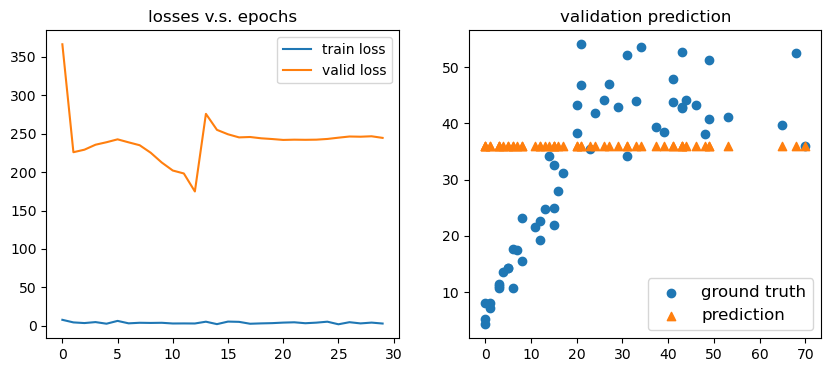

In [254]:
mlp_1 = mlp(num_inputs=1, num_outputs=1, num_hidden_nodes=[10])
print(mlp_1)
train_loss, valid_loss, val_imgs = train_valid_plot(mlp_1, train_ds, valid_ds, num_epochs=30,
                                          batch_size=10, lr=1e-2, loss_function=nn.MSELoss(),
                                          optimizer=torch.optim.SGD)


In [255]:
print("didn't quite converging to the global minimal")
# Learning rate? weight initialization?
plot_sequence_images(val_imgs, interval=200)

didn't quite converging to the global minimal


<Figure size 1200x700 with 0 Axes>

# Why this is the case?
```






































```

### With data normalization

In [258]:
train_ds_norm, x_mean, x_std, y_mean, y_std = normalize_ds(train_ds)
valid_ds_norm = normalize_ds(valid_ds, x_mean, x_std, y_mean, y_std)[0]

**epoch**:  30, &nbsp; **train loss**: 0.0039， &nbsp; **valid loss**: 0.1234

Sequential(
  (0): Linear(in_features=1, out_features=10, bias=True)
  (1): ReLU()
  (2): Linear(in_features=10, out_features=1, bias=True)
)


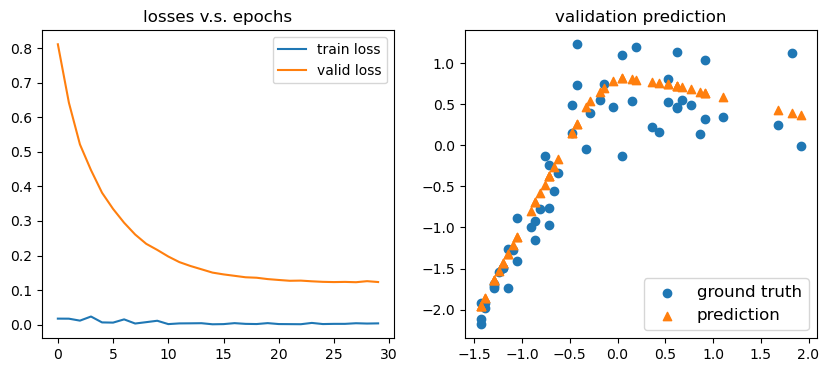

In [259]:
x_mean, x_std= train_ds.x.mean(), train_ds.x.std()
y_mean, y_std= train_ds.y.mean(), train_ds.y.std()
train_ds_norm, valid_ds_norm = copy(train_ds), copy(valid_ds)
train_ds_norm.x = (train_ds.x - x_mean)/x_std
train_ds_norm.y = (train_ds.y - y_mean)/y_std
valid_ds_norm.x = (valid_ds.x - x_mean)/x_std
valid_ds_norm.y = (valid_ds.y - y_mean)/y_std

mlp_1 = mlp(num_inputs=1, num_outputs=1, num_hidden_nodes=[10])
train_loss, valid_loss, val_imgs = train_valid_plot(mlp_1, train_ds_norm, valid_ds_norm,
                            num_epochs=30, optimizer=torch.optim.AdamW,
                            batch_size=10, lr=1e-3, loss_function=nn.MSELoss())
print(mlp_1)

In [71]:
print("Much easier to converge to the global minimal")
plot_sequence_images(val_imgs, interval=100)

Much easier to converge to the global minimal


<Figure size 1200x700 with 0 Axes>

In [72]:
print("Much easier to converge to the global minimal")
plot_sequence_images(val_imgs, interval=100)

Much easier to converge to the global minimal


<Figure size 1200x700 with 0 Axes>

## Exercise

- Training neural network using two variables `['height', 'weight']`
  - Using both linear and non-linear approach
  - With and without data normalization
  - change number of hidden layer and number of hidden layer nodes
  - change the nonlinear function fron `relu` to `tanh`
- How to plot the loss landscape for model with larger number of parameters? （>2）

```






```

===========


# Topic 2 Deep Learning based Classification - Spiral classification

**Recap** Regression v.s. Classification
- Regression predicts continuous numerical values, while classification predicts discrete categories or labels.
- Regression task: minimize the distance between the predicted and true value each point
- Classification task: maximize the probability of each point to a specific class

> Reference material:
> - [Google Tensorflow Playground](https://playground.tensorflow.org/)
> - [Yann Lecun's Deep LEarning Course at NYU](https://cds.nyu.edu/deep-learning/)



In [260]:
# Some Helper Functions
def plot_data(X, y, d=0, auto=False, zoom=1):
    X = X.cpu()
    y = y.cpu()
    plt.scatter(X.numpy()[:, 0], X.numpy()[:, 1], c=y, s=20, cmap=plt.cm.Spectral)
    plt.axis('square')
    plt.axis(np.array((-1.1, 1.1, -1.1, 1.1)) * zoom)
    if auto is True: plt.axis('equal')
    plt.axis('off')

    _m, _c = 0, '.15'
    plt.axvline(0, ymin=_m, color=_c, lw=1, zorder=0)
    plt.axhline(0, xmin=_m, color=_c, lw=1, zorder=0)

def plot_prediction(X, y, model, device='cuda'):
    model.to(device)
    mesh = np.arange(-1.1, 1.1, 0.01)
    xx, yy = np.meshgrid(mesh, mesh)
    with torch.no_grad():
        data = torch.from_numpy(np.vstack((xx.reshape(-1), yy.reshape(-1))).T).float().to(device)
        Z = model(data).detach().cpu()
    Z = np.argmax(Z, axis=1).reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=plt.cm.Spectral, alpha=0.3)
    plot_data(X, y)

# def set_default(figsize=(10, 10), dpi=100):
#     plt.style.use(['dark_background', 'bmh'])
#     plt.rc('axes', facecolor='k')
#     plt.rc('figure', facecolor='k')
#     plt.rc('figure', figsize=figsize, dpi=dpi)


## Generate Spiral Data

In [265]:
X.size()

torch.Size([3000, 2])

In [268]:
# set_default()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
seed = 123456
random.seed(seed)
torch.manual_seed(seed)
N = 1000  # num_samples_per_class
D = 2  # dimensions
C = 3  # num_classes
H = 100  # num_hidden_units

X = torch.zeros(N * C, D).to(device)
y = torch.zeros(N * C, dtype=torch.long).to(device)
for c in range(C):
    index = 0
    t = torch.linspace(0, 1, N)
    # When c = 0 and t = 0: start of linspace
    # When c = 0 and t = 1: end of linpace
    # This inner_var is for the formula inside sin() and cos() like sin(inner_var) and cos(inner_Var)
    inner_var = torch.linspace(
        # When t = 0
        (2 * math.pi / C) * (c),
        # When t = 1
        (2 * math.pi / C) * (2 + c),
        N
    ) + torch.randn(N) * 0.2

    for ix in range(N * c, N * (c + 1)):
        X[ix] = t[index] * torch.FloatTensor((
            math.sin(inner_var[index]), math.cos(inner_var[index])
        ))
        y[ix] = c
        index += 1

print("Shapes:")
print("X:", X.size())
print("y:", y.size())

Shapes:
X: torch.Size([3000, 2])
y: torch.Size([3000])



## Visualize spiral data

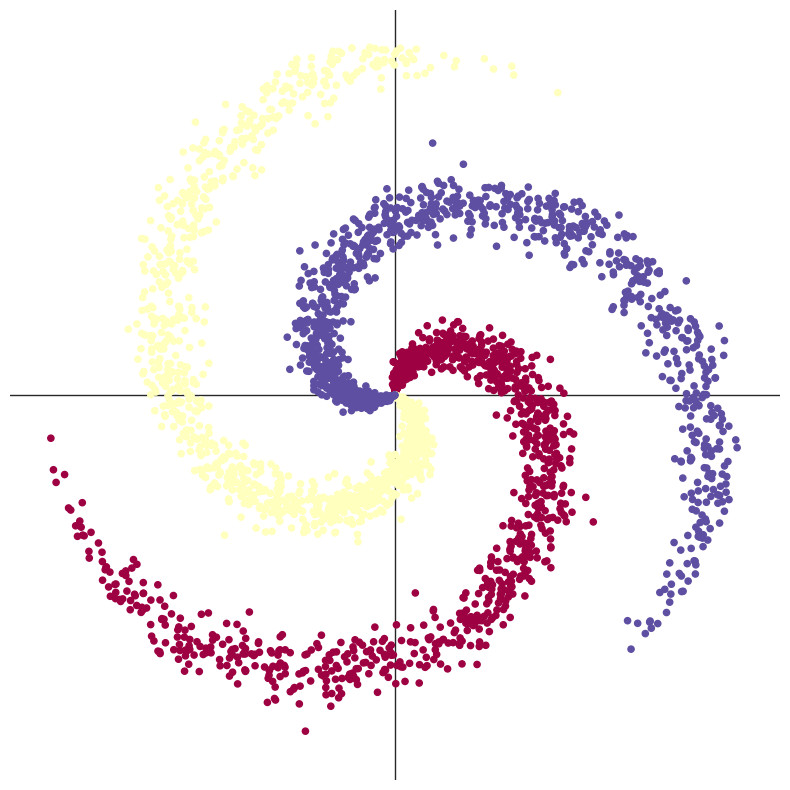

In [269]:
fig, ax = plt.subplots(1,1, figsize=(10,10))
plot_data(X, y)

## Linear classification model
- Define model, loss function, and optimizer

In [270]:
# each Linear module has a weight and bias
model = nn.Sequential(
    nn.Linear(D, H),
    nn.Linear(H, C)
)
model.to(device) #Convert to CUDA
print(model)

Sequential(
  (0): Linear(in_features=2, out_features=100, bias=True)
  (1): Linear(in_features=100, out_features=3, bias=True)
)


In [271]:
#%% use stochastic gradient optimization
learning_rate = 1e-2  # Learning rate
lambda_l2 = 1e-5      # weight decay (L2 normalization) of prevent overfitting
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=lambda_l2)

#%% we use cross entropy loss for classification task
loss_function = torch.nn.CrossEntropyLoss()

display(Markdown("**Is there any non-linearity component here?**"))

**Is there any non-linearity component here?**

## Classification Loss Function

- One-hot-encoded classification:

   |     Class     |    Code (probabilitity)     |
   |---------------|-----------------------------|
   |      Cat      |  [1, 0, 0] |
   |      Dog      |  [0, 1, 0] |
   |    Squirrel   |  [0, 0, 1] |
   | overall probability | [1, 1, 1] |


**Softmax and Probability**

**SoftMax** = multi-class classification for logistic regression


- The $\text{Softmax}(x)$ function is a "special" non-linearity layer that is usually the last operation done in a
network, converting network out put to probabilities (floating numbers between $[0,1]$).

$$\begin{align}\frac{\exp(x_i)}{\sum_j \exp(x_j)}\end{align}$$

------
**Cross Entropy Loss**： the loss function used to optimize logistic regression/softmax problem

- `loss_function = torch.nn.CrossEntropyLoss()` [Several implementations in PyTorch](https://github.com/rasbt/stat479-deep-learning-ss19/blob/master/other/pytorch-lossfunc-cheatsheet.md)


  -This loss function implementation already include the softmax implementation
    - through the  ["LogSumExponential"](https://en.wikipedia.org/wiki/LogSumExp) trick
  
  - Basically, under the hood, it combines
    - the `exponEntial` operation in the `SoftMax` function, and
    - the `negative log-likelihood` function in the cross entropy loss calculation
  - and remove the necessary of computing exponentially large number in the output layer


- The **Cross Entropy Loss** (maximum likelihood estimation)

$$
P(\mathbf{Y} \mid \mathbf{X}) = \prod_{i=1}^n P(\mathbf{y}^{(i)} \mid \mathbf{x}^{(i)}).
$$

- Also called **Negative Log Likelihood (NLL)**
  > maximising $P(\mathbf{Y} \mid \mathbf{X})$ is equivalent to minimizing the negative log-likelihood：

$$-\log P(\mathbf{Y} \mid \mathbf{X}) = \sum_{i=1}^n -\log P(\mathbf{y}^{(i)} \mid \mathbf{x}^{(i)})
= \sum_{i=1}^n l(\mathbf{y}^{(i)}, \hat{\mathbf{y}}^{(i)}),$$

> Ref: https://towardsdatascience.com/binary-cross-entropy-and-logistic-regression-bf7098e75559

## Training

In [292]:
def train_spiral(model, epochs=1000, lr=learning_rate, weight_decay=lambda_l2,
                 loss_function=torch.nn.CrossEntropyLoss(),
                 optimizer_fun = torch.optim.SGD,
                 device='cpu', video_interval=50,):

  model.to(device) #Convert to CUDA 'MPS'
  optimizer = optimizer_fun(model.parameters(), lr=lr, weight_decay=weight_decay) # built-in L2

  # for drawing training sequence
  losses, accuracies, val_images = [], [], []
  fig, ax = plt.subplots(figsize=(12,7))

  # Training
  for t in range(epochs):
      # Training
      y_pred = model(X)                             # Feed forward to get the logits
      loss = loss_function(y_pred, y)               # Compute the loss and accuracy
      optimizer.zero_grad()                         # zero the gradients before running the backward pass.
      loss.backward()                               # Backpropagation to compute the gradient of loss w.r.t learnable params.
      optimizer.step()                              # Update params

      score, predicted = torch.max(y_pred, 1)       # binarize the prediction
      acc = (y == predicted).sum().float() / len(y) # calculate the classification accuracy
      losses.append(loss)
      accuracies.append(acc)
      display(Markdown(f"**[Epoch]**: {t}, **[Loss]**: {loss.item():.6f}, **[Accuracy]**: {acc:.3f}"))
      IPython.display.clear_output(wait=True)

      # Evaluation
      # Plot prediction with trained model
      if t % video_interval == 0:
        plt.cla()
        plot_prediction(X, y, model, device=device)
        model.to(device)
        fig.canvas.draw()       # draw the canvas, cache the renderer
        # image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
        image = np.frombuffer(fig.canvas.buffer_rgba(), dtype='uint8')
        image  = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
        # Convert from RGBA to RGB if needed
        image = image[:, :, :3]
        val_images.append(image)

  losses = torch.stack(losses)
  accuracies = torch.stack(accuracies)
  plt.close()
  return val_images, losses, accuracies

In [293]:
device = 'cpu'
# each Linear module has a weight and bias
model = nn.Sequential(
    nn.Linear(D, H),
    nn.Linear(H, C)
)
model.to(device) #Convert to CUDA

Sequential(
  (0): Linear(in_features=2, out_features=100, bias=True)
  (1): Linear(in_features=100, out_features=3, bias=True)
)

In [294]:
val_images, losses, accuracies = train_spiral(model, epochs=100, video_interval=10, device='cpu')

**[Epoch]**: 99, **[Loss]**: 0.871761, **[Accuracy]**: 0.493

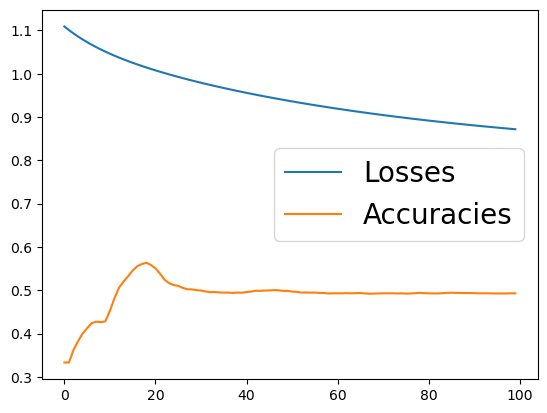

In [295]:
plt.plot(range(len(losses)),losses.detach().cpu())
plt.plot(range(len(accuracies)),accuracies.cpu())
plt.legend(['Losses','Accuracies'], fontsize=20)

In [296]:
plot_sequence_images(val_images, interval=200)

<Figure size 1200x700 with 0 Axes>

## MLP-based classifier
> - add ReLu in between two linear layers
> - to increase the non-linearity in the clasifier



In [297]:
model = nn.Sequential(
    nn.Linear(D, H),
    nn.ReLU(),
    nn.Linear(H, C)
)

print(model)

Sequential(
  (0): Linear(in_features=2, out_features=100, bias=True)
  (1): ReLU()
  (2): Linear(in_features=100, out_features=3, bias=True)
)


### Start training MLP classifier

In [298]:
lr = 5e-3
lambda_l2 = 1e-5

val_images, losses, accuracies = train_spiral(model, epochs=1000, lr=lr,
                                              optimizer_fun = torch.optim.Adam)

**[Epoch]**: 999, **[Loss]**: 0.018085, **[Accuracy]**: 0.999

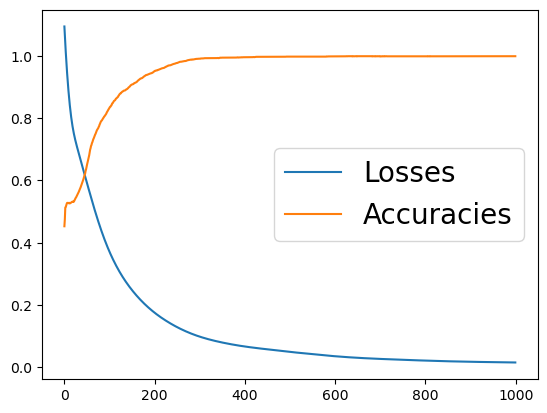

In [85]:
plt.plot(range(len(losses)),losses.detach().cpu())
plt.plot(range(len(accuracies)),accuracies.cpu())
plt.legend(['Losses','Accuracies'], fontsize=20)

In [299]:
plot_sequence_images(val_images, interval=100)

<Figure size 1200x700 with 0 Axes>

## Exercise

- Understand the benifit "LogSumExponential" Tricks, and the benefit to combine soft-max and cross-entropy

[Reference](https://ljvmiranda921.github.io/notebook/2017/08/13/softmax-and-the-negative-log-likelihood/)

# Topic 3: Convolutional Neural Network for Image classification

In [300]:
#%% import libraries

%matplotlib inline
import os, pandas as pd, math, io
import math, time, random
from pathlib import Path
import numpy as np, torch, torchvision
import torch
from torch.utils import data
from torch.utils.data  import Dataset, DataLoader

from torch import nn
import torch.nn.functional as F
from torchvision import transforms, datasets

import matplotlib.pyplot as plt
import IPython
from IPython.display import display, Markdown, Latex
from copy import copy


     - Some utility functions

In [301]:
class Timer:
  ''' record multiple running time. '''
  def __init__(self):
    self.times = []
    self.start()

  def start(self):
    """start the timer"""
    self.tik = time.time()

  def stop(self):
    """stop the timer, record on list"""
    self.times.append(time.time()-self.tik)
    return self.times[-1]

  def avg(self):
    """return average time"""
    return sum(self.times) / len(self.times)

  def cumsum(self):
    """return the accumulated time."""
    return sum(self.times)

class Accumulator:
    """For accumulating sums over `n` variables."""
    def __init__(self, n):
        self.data = [0.0] * n

    def add(self, *args):
        self.data = [a + float(b) for a, b in zip(self.data, args)]

    def reset(self):
        self.data = [0.0] * len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

#%% check parameter size
def print_param_size(net):
  # check parameter size
  print("=== parameter size ===")
  for p in net.parameters():
      print(list(p.shape))

#%% check network layerwise feature size
def print_layerwise_feature_size(net, X, batch_size=50):
    # from IPython.display import display, Markdown, Latex
    print("=== feature size ===")
    if isinstance(X, Dataset):
      X = DataLoader(X, batch_size=batch_size)
    if isinstance(X, DataLoader):
      X, _ = next(iter(X))
    if isinstance(X,torch.Tensor) and len(X.shape) < 1:
      X = x.reshape(1,-1)
    for layer in net:
        X = layer(X)
        print(f"{layer.__class__.__name__:<8} \t output shape: \t {list(X.shape)}")
        # display(Markdown(f"**{layer.__class__.__name__}** output shape: \t {X.shape}"))

#%% Initial netork layer weights/bias
def init_layer_weights(l):
  if type(l) == nn.Linear:
    #%% kaiming/xavier initial?
    stdv = 1. / math.sqrt(l.weight.size(1)) # stdv based on weight feature size
    l.weight.data.uniform_(-stdv, stdv)
    if l.bias is not None:
      l.bias.data.uniform_(-stdv, stdv)
      
def plot_convolution(X, conv2d, cmap='gray'):
  Y = conv2d(X).detach()
  fig, ax = plt.subplots(1,3, figsize=(24, 8))
  ax[0].imshow(X.squeeze(),cmap=cmap)
  ax[1].imshow(conv2d.weight.data.squeeze().unsqueeze(0), cmap=cmap)
  ax[2].imshow(Y.squeeze().detach(), cmap=cmap)

  ax[0].set_title(f"Before convolution",fontsize=20);
  ax[1].set_title(f"Convolution Kernel \n{conv2d.weight.squeeze().data.numpy()}",fontsize=20);
  ax[2].set_title(f"After convolution",fontsize=20);

- Get the data (MedNIST)

In [324]:
# - Get the data (MedNIST)
text_labels = ['AbdomenCT','BreastMRI', 'CXR', 'ChestCT', 'Hand', 'HeadCT'] # os.listdir('data/MedNIST'))

def get_mednist_labels(labels):
    """Return text labels for the Med-MNIST dataset."""
    return [text_labels[int(i)] for i in labels]

def show_images(imgs, num_rows, num_cols, titles=None, scale=2, cmap='gray'):
    """Plot a list of images."""
    figsize = (num_cols * scale, num_rows * scale)
    _, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    axes = axes.flatten()
    for i, (ax, img) in enumerate(zip(axes, imgs)):
        if torch.is_tensor(img):
            ax.imshow(img.numpy(), cmap=cmap)       # Tensor Image
        else:
            ax.imshow(img, cmap=cmap)              # PIL Image
        ax.axes.get_xaxis().set_visible(False)
        ax.axes.get_yaxis().set_visible(False)
        if titles:
            ax.set_title(titles[i])
    return axes

# - Minibatch data loader
def generate_mednist_dataset(resize=None, root_dir='data', train_frac=0.05, test_frac=0.005):
    from monai.apps import MedNISTDataset
    from monai import transforms as trans_monai
    from monai.transforms import Resized, Compose
    trans = [trans_monai.LoadImaged('image'), trans_monai.EnsureChannelFirstd('image'), 
            trans_monai.ScaleIntensityd('image')] #, trans_monai.ToTensord('image')]
    if resize:
        trans.insert(2, Resized('image',resize))
    trans = Compose(trans)
    Path(root_dir).mkdir(exist_ok=True, parents=True)
    medmnist_train = MedNISTDataset(root_dir=root_dir, section="validation", val_frac=train_frac, cache_rate=1., transform=trans, download=True)
    medmnist_test = MedNISTDataset(root_dir=root_dir, section="test", test_frac=test_frac, cache_rate=1., transform=trans, download=True)
    return medmnist_train, medmnist_test

def load_data_medmnist(batch_size, medmnist_train, medmnist_test):
    """Download the Fashion-MNIST dataset and then load it into memory."""
    return (data.DataLoader(medmnist_train, batch_size, shuffle=True), data.DataLoader(medmnist_test, batch_size, shuffle=False))

- Model performance evaluation

In [325]:
def accuracy(y_hat, y):
    """Compute the number of correct predictions."""
    if len(y_hat.shape) > 1 and y_hat.shape[1] > 1:
        y_hat = y_hat.argmax(axis=1)
    cmp = y_hat.type(y.dtype) == y
    return float(cmp.type(y.dtype).sum())
                 
def evaluate_accuracy(net, data_iter, device=None):
    """Compute the accuracy for a model on a dataset using a GPU."""
    if isinstance(net, torch.nn.Module):
        net.eval()  # Set the model to evaluation mode
    if not device:
        device = list(net.parameters())[0].device
    # No. of correct predictions, no. of predictions
    metric = Accumulator(2)
    for batch in data_iter:
        X, y, c = batch['image'], batch['label'], batch['class_name']
        if isinstance(X, list):
            X = [x.to(device) for x in X]
        else:
            X = X.to(device)
        y = y.to(device)
        metric.add(accuracy(net(X), y), y.numel())
    return metric[0] / metric[1]

- Training process loops
> some helper functions

In [326]:
def init_weights(l):
    if type(l) == nn.Linear:
        nn.init.normal_(l.weight, std=0.01)

In [327]:
def train_epoch(net, train_iter, loss, updater, device=None):
    """The training loop defined in Chapter 3."""
    # Set the model to training mode
    if isinstance(net, torch.nn.Module):
        net.train()
    if not device:
        device = list(net.parameters())[0].device
    # Sum of training loss, sum of training accuracy, no. of examples
    metric = Accumulator(3)
    for batch in train_iter:
        X, y, c = batch['image'], batch['label'], batch['class_name']
        X, y = X.to(device), y.to(device)
        # Compute gradients and update parameters
        y_hat = net(X)
        l = loss(y_hat, y)
        if isinstance(updater, torch.optim.Optimizer):
            # Using PyTorch in-built optimizer & loss criterion
            updater.zero_grad()
            l.backward()
            updater.step()
            metric.add(float(l) * len(y), accuracy(y_hat, y), y.numel())
        else:
            # Using custom built optimizer & loss criterion
            l.sum().backward()
            updater(X.shape[0])
            metric.add(float(l.sum()), accuracy(y_hat, y), y.numel())
    # Return training loss and training accuracy
    return metric[0] / metric[2], metric[1] / metric[2]


In [370]:
def train(net, train_iter, test_iter, loss, num_epochs, optimimzer, lr, device='mps', verbose=True):
    """Train a model (defined in Chapter 3)."""
#     animator = Animator(xlabel='epoch', xlim=[1, num_epochs], ylim=[0.3, 0.9],
#                         legend=['train loss', 'train acc', 'test acc'])
    # initialize
    net.apply(init_weights)
    print('training on', device)
    net.to(device)
    timer, num_batches = Timer(), len(train_iter)
    train_loss_array, train_acc_array, test_acc_array = np.empty(0), np.empty(0), np.empty(0)
    updater = optimizer(net.parameters(), lr=lr)

    for epoch in range(num_epochs):
        timer.start()
        train_metrics = train_epoch(net, train_iter, loss, updater)
        train_loss, train_acc = train_metrics
        test_acc = evaluate_accuracy(net, test_iter)
        
        train_loss_array = np.append(train_loss_array, train_loss)
        train_acc_array = np.append(train_acc_array, train_acc)
        test_acc_array = np.append(test_acc_array, test_acc)
        if verbose is True: 
          display(Markdown(f"**epoch:** {epoch} **train_loss**: {train_loss:.3f} **train_acc**: {train_acc:.3f} **test_acc**: {test_acc:.3f}"))        
          IPython.display.clear_output(wait=True)
        timer.stop()
    
    return train_loss_array, train_acc_array, test_acc_array

In [371]:
def plot_train_tracker(metrics, metrics_names=None, num_epochs=None, fontsize=20):
    fig, ax = plt.subplots(1,1, figsize=(10,15))
    if num_epochs is None: num_epochs = len(metrics[0])
    for metric in metrics:
        ax.plot(list(range(num_epochs)), metric)
    ax.set_xticks(range(0,num_epochs,2))
    ax.set_xlabel("epochs")
    if metrics_names is not None:
        ax.legend(metrics_names, fontsize=fontsize)

In [372]:
def predict(net, test_iter, n=6):
    """Predict labels (defined in Chapter 3)."""
    net.to('cpu')
    for batch in test_iter:
        X, y = batch['image'], batch['label']
        break
    trues = get_mednist_labels(y)
    preds = get_mednist_labels(net(X).argmax(axis=1))
    titles = [true + '\n' + pred for true, pred in zip(trues, preds)]
    show_images(X[0:n].squeeze(), 1, n, titles=titles[0:n])

## From Fully-connected network ==> to Convlutional Neural Network (CNN)

**Question**, how to apply deep neural network to multi-dimentional structured data (e.g. 2D/3D Medical Image data)?

Issue with fully connected neural network (MLP):
- 1. The input features are 1-dimensional arrays
  - have to `flatten` the input image data, therefore, lost the spatial correlation information across adjacent pixels
- 2. The "Fully connected" nature will cause large number of parameters
  - computational intensive
  - causing `overfitting` problem: model fit "too well" on the training data, 
    - and loose generalizability on the validation/testing data

- **Solution**: Convlutional Neural Network (CNN)

**Image convolution**: 
element-wise multiplication
=> summation
=> sliding windows

![Image convolution](https://d2l.ai/_images/correlation.svg)

Two-dimensional cross-correlation operation: $0\times0+1\times1+3\times2+4\times3=19$.

![img](https://upload.wikimedia.org/wikipedia/commons/e/ee/Convolution_arithmetic_-_Same_padding_no_strides.gif)

### Convolution example - Vertical edge detector

In [373]:
X = torch.ones((9, 9)); X[:, 3:6] = 0; X = X.reshape(1,1,*X.shape)
conv2d_gt = nn.Conv2d(1, 1, kernel_size=(1, 2), bias=False)
conv2d_gt.weight.data = torch.tensor([[[[2.0, -2.0]]]])
Y = conv2d_gt(X).detach()

print("X: ", X)
print("Convolutional kernel: ", conv2d_gt.weight.data)
print("Y: ",Y)
print(X.shape, Y.shape)

X:  tensor([[[[1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.],
          [1., 1., 1., 0., 0., 0., 1., 1., 1.]]]])
Convolutional kernel:  tensor([[[[ 2., -2.]]]])
Y:  tensor([[[[ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.],
          [ 0.,  0.,  2.,  0.,  0., -2.,  0.,  0.]]]])
torch.Size([1, 1, 9, 9]) torch.Size([1

In [374]:
def plot_convolution(X, conv2d, cmap='gray'):
  Y = conv2d(X).detach()
  fig, ax = plt.subplots(1,3, figsize=(24, 8))
  ax[0].imshow(X.squeeze(),cmap=cmap)
  ax[1].imshow(conv2d.weight.data.squeeze().unsqueeze(0), cmap=cmap)
  ax[2].imshow(Y.squeeze().detach(), cmap=cmap)

  ax[0].set_title(f"Before convolution",fontsize=20);
  ax[1].set_title(f"Convolution Kernel \n{conv2d.weight.squeeze().data.numpy()}",fontsize=20);
  ax[2].set_title(f"After convolution",fontsize=20);

**Ground truth convolutional kernel**: [ 2. -2.]

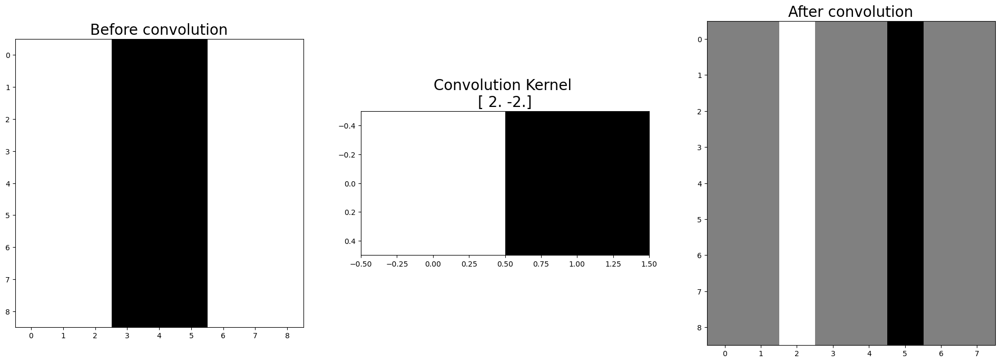

In [375]:
plot_convolution(X, conv2d_gt)
display(Markdown(f"**Ground truth convolutional kernel**: {conv2d_gt.weight.squeeze().data.numpy()}"))

### Learning a convolutional kernel
> Using exactly the same gradient-decent optimization approach": `Backpropagation`

**Random initialized convolutional kernel**: [-0.17436294  0.3440426 ]

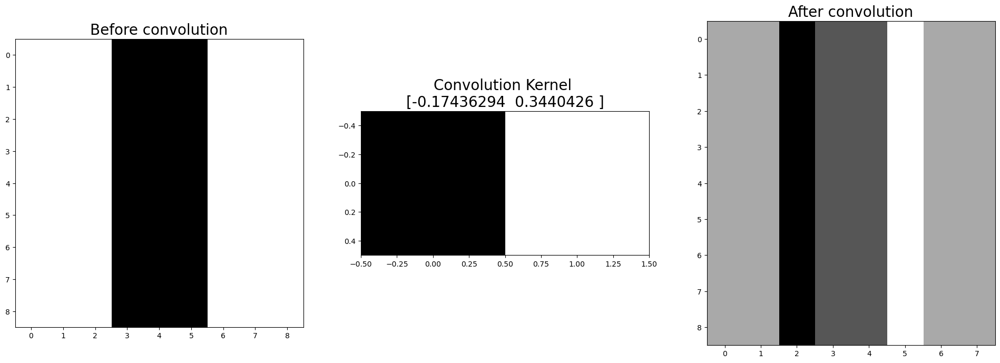

In [376]:
conv2d = nn.Conv2d(1, 1, kernel_size=(1, 2), bias=False)
plot_convolution(X, conv2d)
display(Markdown(f"**Random initialized convolutional kernel**: {conv2d.weight.squeeze().data.numpy()}"))

In [377]:
conv2d = nn.Conv2d(1, 1, kernel_size=(1, 2), bias=False)
display(Markdown(f"**Random initialized convolutional kernel**: {conv2d.weight.squeeze().data.numpy()}"))

lr = 1e-3  # Learning rate
for i in range(300):
  Y_hat = conv2d(X)     # prediction
  l = (Y_hat - Y)**2    # calculate loss
  conv2d.zero_grad()    # zero gradient
  l.sum().backward()    # back-propagation
  conv2d.weight.data[:] -= lr * conv2d.weight.grad # gradient descent for one step
  if (i+1) % 50 == 0:
      print(f'batch {i + 1}, loss {l.sum():.3f}')
      
display(Markdown(f"**Learned convolutional kernel**: {conv2d.weight.squeeze().data.numpy()}"))
display(Markdown(f"**Ground truth convolutional kernel**: {conv2d_gt.weight.squeeze().data.numpy()}"))

**Random initialized convolutional kernel**: [0.18999183 0.5377273 ]

batch 50, loss 14.344
batch 100, loss 2.332
batch 150, loss 0.379
batch 200, loss 0.062
batch 250, loss 0.010
batch 300, loss 0.002


**Learned convolutional kernel**: [ 1.9906529 -1.9906529]

**Ground truth convolutional kernel**: [ 2. -2.]

**convolutional kernel after training**: [ 1.9906529 -1.9906529]

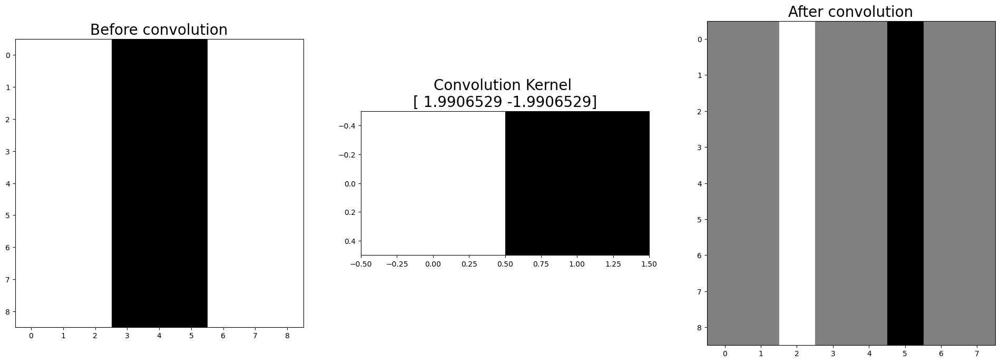

In [378]:
plot_convolution(X, conv2d)
display(Markdown(f"**convolutional kernel after training**: {conv2d.weight.squeeze().data.numpy()}"))

## Padding and stride
![img](https://miro.medium.com/max/700/1*uk4KJEtyDuPOipfG4yd-WA.gif)

In [379]:
conv2d

Conv2d(1, 1, kernel_size=(1, 2), stride=(1, 1), bias=False)

In [380]:
Y = conv2d(X)
X.squeeze().shape, Y.squeeze().shape

(torch.Size([9, 9]), torch.Size([9, 8]))

In [381]:
conv2d_pad1 = nn.Conv2d(1, 1, kernel_size=(1, 3), padding=(0,1), bias=False)
Y = conv2d_pad1(X)
X.shape,  Y.shape

(torch.Size([1, 1, 9, 9]), torch.Size([1, 1, 9, 9]))

- Question: Why do we need to use kernel size (1, 3)?
  - What if we use (1,2)?

## Pooling operation

Max pooling layer
![max pooling](https://d2l.ai/_images/pooling.svg)

$$
\max(0, 1, 3, 4)=4,\\
\max(1, 2, 4, 5)=5,\\
\max(3, 4, 6, 7)=7,\\
\max(4, 5, 7, 8)=8.\\
$$

### Discussion point:

- Can max pooling layer be substitued by the convolutional layer?
- What's the advantage/disadvantage?


## Le-Net
> [LeCun et al., 1998]
> LeCun, Y., Bottou, L., Bengio, Y., Haffner, P., & others. (1998). Gradient-based learning applied to document recognition. Proceedings of the IEEE, 86(11), 2278–2324.

![Data flow in LeNet. The input is a handwritten digit, the output a probability over 10 possible outcomes.](http://d2l.ai/_images/lenet.svg)


In [382]:
resize = (28,28)
num_inputs = resize[0]*resize[1] # 784
num_outputs = len(text_labels) # 6

In [383]:
net = torch.nn.Sequential(nn.Conv2d(1, 6, kernel_size=5,padding=2), nn.Sigmoid(),
                          nn.AvgPool2d(kernel_size=2, stride=2),
                          nn.Conv2d(6, 16, kernel_size=5), nn.Sigmoid(),
                          nn.AvgPool2d(kernel_size=2, stride=2), nn.Flatten(),
                          # need to manually calculate the input size
                          nn.Linear(16 * 5 * 5, 120), nn.Sigmoid(), # input have to be 28* 28
                          nn.Linear(120, 84), nn.Sigmoid(), nn.Linear(84, num_outputs))
net

Sequential(
  (0): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (1): Sigmoid()
  (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (4): Sigmoid()
  (5): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (6): Flatten(start_dim=1, end_dim=-1)
  (7): Linear(in_features=400, out_features=120, bias=True)
  (8): Sigmoid()
  (9): Linear(in_features=120, out_features=84, bias=True)
  (10): Sigmoid()
  (11): Linear(in_features=84, out_features=6, bias=True)
)

In [384]:
X = torch.rand(size=(1, 1, 28, 28), dtype=torch.float32)
print_layerwise_feature_size(net,X)

=== feature size ===
Conv2d   	 output shape: 	 [1, 6, 28, 28]
Sigmoid  	 output shape: 	 [1, 6, 28, 28]
AvgPool2d 	 output shape: 	 [1, 6, 14, 14]
Conv2d   	 output shape: 	 [1, 16, 10, 10]
Sigmoid  	 output shape: 	 [1, 16, 10, 10]
AvgPool2d 	 output shape: 	 [1, 16, 5, 5]
Flatten  	 output shape: 	 [1, 400]
Linear   	 output shape: 	 [1, 120]
Sigmoid  	 output shape: 	 [1, 120]
Linear   	 output shape: 	 [1, 84]
Sigmoid  	 output shape: 	 [1, 84]
Linear   	 output shape: 	 [1, 6]


- Loading data

> It might take the while to download and extract the data during the first time of running the cell

In [385]:
# trans = transforms.ToTensor()
# Path('data').mkdir(exist_ok=True)
# mnist_train = torchvision.datasets.FashionMNIST(root="data", train=True,transform=trans,download=True)
# mnist_test = torchvision.datasets.FashionMNIST(root="data",train=False,transform=trans, download=True)
# print("Train: ", len(mnist_train), "Test: ", len(mnist_test), "Image size: ", mnist_train[0][0].shape)

In [386]:
# generating dataset in the memory
resize = (28,28)
medmnist_train, medmnist_test = generate_mednist_dataset(resize=resize, train_frac=0.1, test_frac=0.01)

2025-05-30 11:26:57,931 - INFO - Verified 'MedNIST.tar.gz', md5: 0bc7306e7427e00ad1c5526a6677552d.
2025-05-30 11:26:57,932 - INFO - File exists: data/MedNIST.tar.gz, skipped downloading.
2025-05-30 11:26:57,932 - INFO - Non-empty folder exists in data/MedNIST, skipped extracting.
2025-05-30 11:27:02,239 - INFO - Verified 'MedNIST.tar.gz', md5: 0bc7306e7427e00ad1c5526a6677552d.
2025-05-30 11:27:02,239 - INFO - File exists: data/MedNIST.tar.gz, skipped downloading.
2025-05-30 11:27:02,240 - INFO - Non-empty folder exists in data/MedNIST, skipped extracting.


In [387]:
# generating mini-batch data loader
batch_size = 512
print(f"Train: {len(medmnist_train)}, Test: {len(medmnist_test)}")
train_iter, test_iter = load_data_medmnist(batch_size, medmnist_train, medmnist_test)

Train: 5420, Test: 542


### Training with SGD optimizer
- PyTorch-Lightning

In [388]:
lr, num_epochs = 1, 100
optimizer, loss = torch.optim.SGD, nn.CrossEntropyLoss()   
train_losses, train_accs, test_accs = train(net, train_iter, test_iter, loss, num_epochs, optimizer, lr) #, 'cuda')

**epoch:** 99 **train_loss**: 0.700 **train_acc**: 0.688 **test_acc**: 0.686

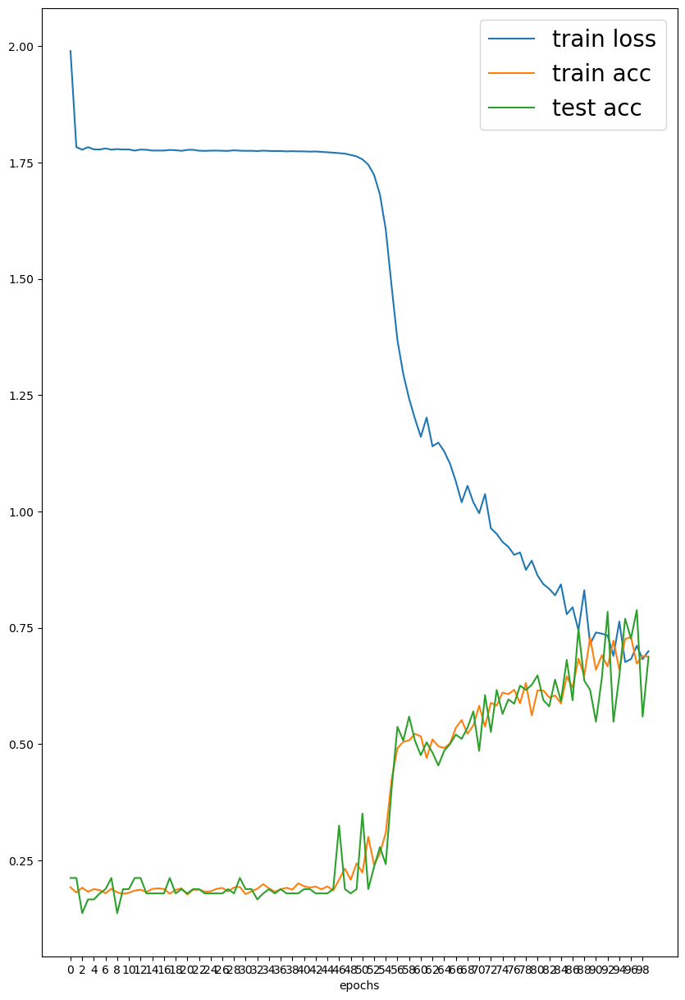

In [389]:
metrics = [train_losses, train_accs, test_accs]
metrics_name = ['train loss', 'train acc', 'test acc']
plot_train_tracker(metrics, metrics_name)

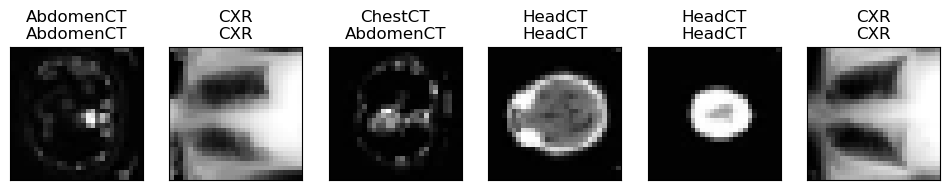

In [390]:
# make predictions
predict(net, test_iter)

## AdamW optimizer

- learning rate scheduler ([Reference](https://ruder.io/optimizing-gradient-descent/))
- Adam: Adaptive Moment Estimation (Adam)

- AdamW: Adam with weight decay
  ([Ref1](https://towardsdatascience.com/why-adamw-matters-736223f31b5d),
  [Ref2](https://arxiv.org/abs/1711.05101))


In [391]:
lr, num_epochs = 0.01, 100,
optimizer, loss = torch.optim.AdamW, nn.CrossEntropyLoss()   
train_losses, train_accs, test_accs = train(net, train_iter, test_iter, loss, num_epochs, optimizer, lr, 'cuda')

training on cuda


AssertionError: Torch not compiled with CUDA enabled

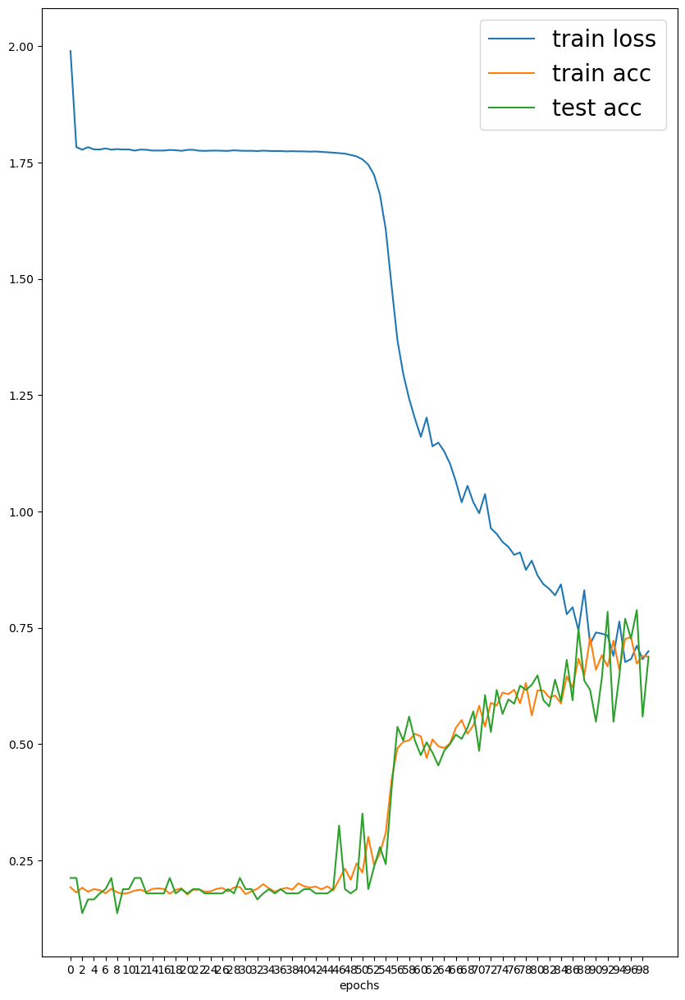

In [392]:
metrics = [train_losses, train_accs, test_accs]
metrics_name = ['train loss', 'train acc', 'test acc']
plot_train_tracker(metrics, metrics_name)

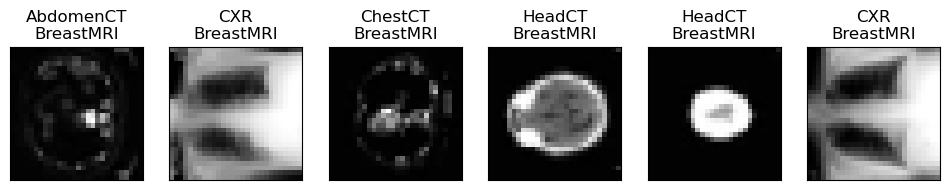

In [393]:
# make predictions
predict(net, test_iter)

# Stratified dataloader from unbalanced data

> Before running the cells in this section, you shall remove some data from specific class folders inside the 'data' folder, to artificially making the data more unbalanced, and better visualize the effect to handle the unbalanced dat

- Ref: https://discuss.pytorch.org/t/balanced-sampling-between-classes-with-torchvision-dataloader/2703
- Ref: https://discuss.pytorch.org/t/how-to-prevent-overfitting/1902/5

In [394]:
from pathlib import Path
data_dir = f"{os.getcwd()}/data/MedNIST_unbalanced/"

def cal_class_weight(data_dir):
  classes = [c for c in os.listdir(data_dir) if c != "README.md"]
  nclasses = len(classes)
  counts = [0]  * nclasses
  for c in classes:
    class_sample = len(os.listdir(f"{data_dir}/{c}"))
    print(f"{c}: {class_sample}")

In [395]:
# classes
dataset_all = datasets.ImageFolder(data_dir)   

In [396]:
# check class labels
labels = dataset_all.targets
np.unique(labels)

array([0, 1, 2])

In [397]:
# get input
paths = [p[0] for p in dataset_all.imgs]
# paths

## Train/Valid split

In [398]:
from sklearn.model_selection import train_test_split

train_idx, valid_idx= train_test_split(
    np.arange(len(labels)), test_size=0.2, random_state=42, shuffle=True, stratify=labels)

In [399]:
paths_train, paths_val, labels_train, labels_val = train_test_split(paths, labels, test_size=0.1, stratify=labels)

In [400]:
pd.DataFrame(labels).value_counts()

0
0    9936
2    9912
1    1538
Name: count, dtype: int64

Text(0.5, 0.98, 'Class Distribution')

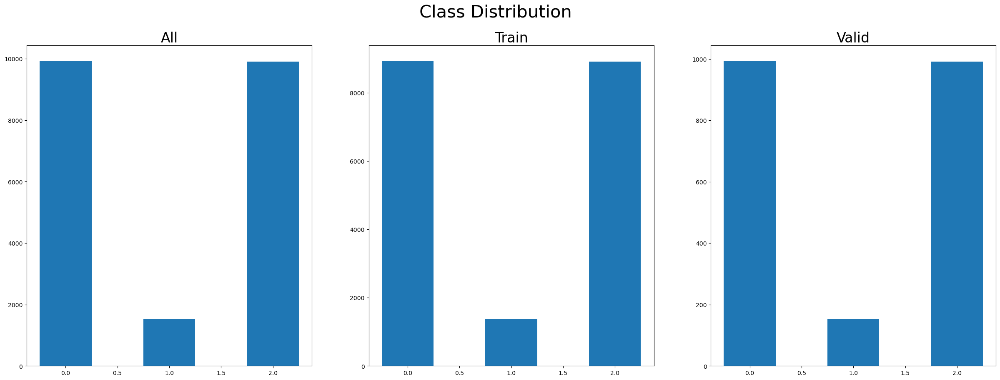

In [401]:
# Test the stratified train/valid split
fig, ax = plt.subplots(1,3, figsize = (30, 10))
bins = range(len(np.unique(labels))+1)
ax[0].hist(labels, bins=bins, rwidth=0.5, align='left');       ax[0].set_title('All', fontsize=24)
ax[1].hist(labels_train, bins=bins, rwidth=0.5, align='left'); ax[1].set_title('Train', fontsize=24)
ax[2].hist(labels_val, bins=bins, rwidth=0.5, align='left');   ax[2].set_title('Valid', fontsize=24)  
fig.suptitle('Class Distribution', fontsize=30)

- construct the dataset/dataloader

In [402]:
class Stratified_Dataset(Dataset):
  def __init__(self, paths, labels):
    self.paths = paths
    self.labels = labels
    
  def __len__(self):
    return len(self.labels)
  
  def __getitem__(self,idx):
    return self.paths[idx], self.labels[idx]

In [403]:
train_dataset = Stratified_Dataset(paths_train, labels_train)
val_dataset = Stratified_Dataset(paths_val, labels_val)

## Stratified dataloader sampler

In [404]:
def make_weights_for_balanced_classes(images_label_pairs, nclasses):                        
    count = [0] * nclasses                                                      
    for _, label in images_label_pairs:                                                         
        count[label] += 1                                                     
    weight_per_class = [0.] * nclasses                                      
    N = float(sum(count))                                                   
    for i in range(nclasses):                                                   
        weight_per_class[i] = N/float(count[i])  
      
    weight = [0] * len(images_label_pairs)                                              
    for idx, val in enumerate(images_label_pairs):                                          
        weight[idx] = weight_per_class[val[1]]                                  
    return torch.DoubleTensor(weight) 
  

In [405]:
classes = np.unique(labels)
classes, len(classes)

(array([0, 1, 2]), 3)

### batch dataloader without weighted sampler

In [406]:
# build sampler
batch_size = 1000
# sampler = torch.utils.data.sampler.WeightedRandomSampler(weights, len(weights))
# build dataloader
train_loader_unbalanced = DataLoader(train_dataset, batch_size=batch_size, shuffle = True, num_workers=0, pin_memory=True)

Text(0.5, 1.0, 'Batch sampler')

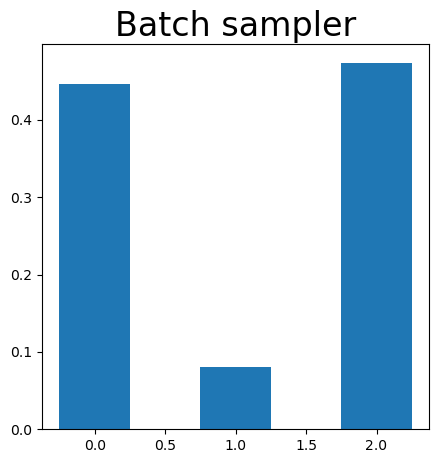

In [407]:
X, y = next(iter(train_loader_unbalanced))
fig, ax = plt.subplots(figsize = (5, 5))
bins = range(len(np.unique(labels))+1)
ax.hist(y.numpy(), bins=bins, rwidth=0.5, align='left', density=True); ax.set_title('Batch sampler', fontsize=24)

### batch dataloader with weighted sampler

In [408]:
# calculate weight for each 
weights = make_weights_for_balanced_classes(train_dataset, len(classes))                                                                
weights.unique(), len(weights)

(tensor([ 2.1524,  2.1575, 13.9068], dtype=torch.float64), 19247)

In [409]:
# build sampler
batch_size = 1000
sampler = torch.utils.data.sampler.WeightedRandomSampler(weights, len(weights))
# build dataloader
train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler = sampler, num_workers=0, pin_memory=True) # shuffle = True,

Text(0.5, 1.0, 'Batch sampler')

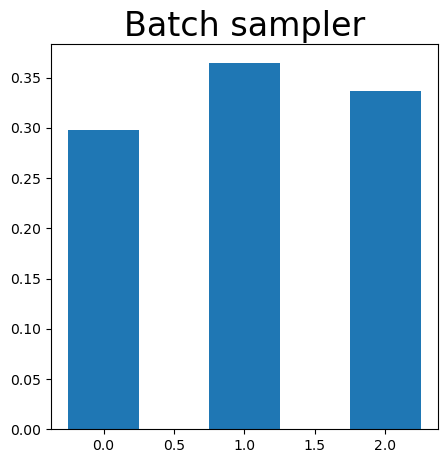

In [410]:
X, y = next(iter(train_loader))
fig, ax = plt.subplots(figsize = (5, 5))
bins = range(len(np.unique(labels))+1)
ax.hist(y.numpy(), bins=bins, rwidth=0.5, align='left', density=True); ax.set_title('Batch sampler', fontsize=24)

> Another approach to solve class imbalance issue is using **class-weighted loss function** 

# End of bootcamp tutorial